# Segmentarea Semantică pe Imagini

Segmentarea imaginii este sarcina de **împărțire a unei imagini în segmente** care reprezintă zone semnificative — cum ar fi obiecte, limite sau regiuni — astfel încât fiecare pixel să fie grupat cu altele similare pentru o analiză sau procesare mai ușoară.

Tipuri de segmentare:
- *Segmentare semantică:* Clasifică fiecare pixel într-o categorie (de exemplu, drum, mașină, cer), dar nu face distincție între diferite instanțe ale aceleiași clase.
- *Segmentare de instanță:* La fel ca segmentarea semantică, dar face distincție între diferite obiecte ale aceleiași clase (de exemplu, persoana 1 vs persoana 2).
- *Segmentare panoptică:* Combină segmentarea semantică și segmentarea instanțelor.

segmentation-types.avif
*[image source]([[source=https://www.v7labs.com/blog/image-segmentation-guide]])*


### Cum funcționează
Segmentarea imaginii funcționează prin atribuirea unei etichete fiecărui pixel dintr-o imagine, astfel încât pixelii cu aceeași etichetă să aibă anumite caracteristici comune. Aceste caracteristici pot fi bazate pe:
* **Culoare:** gruparea pixelilor cu valori de culoare similare.
* **Textură:** identificarea regiunilor cu modele sau texturi similare.
* **Discontinuități:** detectarea schimbărilor bruște ale valorilor pixelilor, care indică adesea margini și limite.


### Tehnici de segmentare
- *Tehnici CV/ML:*
    - **Edge-based** segmentation: Se concentrează pe identificarea limitelor dintre regiunile separate dintr-o imagine.
    - **Threshold-based** segmentation: Utilizează praguri (thresholds) pentru a separa pixelii în diferite grupuri.
    - **Clustering**-based segmentation: Aplică algoritmi de clusterizare (de exemplu, k-means) pentru a separa pixelii în diferite grupuri.
- **_Tehnici Deep Learning:_** Utilizarea rețelelor neuronale, precum U-Net și ResNet.

### Aplicații practice

*   *Medical imaging:* Identificarea tumorilor sau organelor.
*   *Autonomous driving:* Detectarea benzilor de circulație, pietonilor, vehiculelor.
*   *Satellite imagery:* Segmentarea pădurilor, drumurilor, apelor.
*   *Photo editing:* Izolarea obiectelor pentru aplicarea filtrelor sau eliminarea fundalului.

### Librării

In [3]:
import cv2 # Computer Vision
import numpy as np # Numerical Operations
import matplotlib.pyplot as plt # Visualization
from PIL.Image import Image

import torch
import torch.nn as nn # Neural Networks
import torch.nn.functional as F # Functional operations related Neural Networks
import torch.optim as optim # Optimization Operations
from torch.utils.data import random_split, DataLoader, Subset # Data

import torchvision # Computer Vision utils for Machine Learning
import torchvision.transforms as transforms

seed = 42
np.random.seed(seed)
torch.manual_seed(seed)

### Toolkit cu diverse utilități pentru vizualizare

In [42]:
class VisualizationToolkit:
    def visualize_datapoint(
        self, img: np.ndarray, gt_mask: np.ndarray, pred_mask: np.ndarray | None = None
    ):
        """
        Plots the given image, the given mask, and the predicted segmentation
        mask (if given).

        Preconditii:
        - imaginea trebuie sa fie in multimea {0, 1, .., 255} sau in intervalul
          (0, 1) si sa aiba dimensiunea (H, W, 3).
        - masca de segmentare trebuie sa fie in multimea {0, 1, .., c} si sa
          aiba dimensiunea (H, W)
        """
        cmap = "BuPu"
        img = (img * 255).astype("uint8") if img.max() <= 1 else img

        if pred_mask is not None:
            _, axes = plt.subplots(1, 3, figsize=(9, 3))
            axes[2].imshow(pred_mask, cmap=cmap)
            axes[2].set_title("Prediction")
        else:
            _, axes = plt.subplots(1, 2, figsize=(6, 3))

        axes[0].imshow(img)
        axes[0].set_title("Image")
        axes[1].imshow(gt_mask, cmap=cmap)
        axes[1].set_title("Ground Truth")

        for ax in axes:
            ax.axis("off")

        plt.show()

    def compute_stats(self, img: np.ndarray, gt_mask: np.ndarray):
        """
        Displays some distributions related to the image and the ground truth mask.
        """
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 2, 1)
        plt.hist(img.flatten())
        plt.title(
            f"Dimensiune: {img.shape}"
            f"\nTip: {img.dtype}"
            f"\nSpatiu imagine: ({img.min():.4f}, {img.max():.4f})"
        )

        plt.subplot(1, 2, 2)
        plt.hist(gt_mask.flatten())
        plt.title(
            f"Dimensiune: {gt_mask.shape}"
            f"\nTip: {gt_mask.dtype}"
            f"\nSpatiu segmentare: ({gt_mask.min():.4f}, {gt_mask.max():.4f})"
        )

    def img_to_str(self, img: np.ndarray):
        return np.array([
            [','.join(map(str, pixel)) for pixel in row]
            for row in img
        ])

    def _window_mean(self, arr: np.ndarray, window_size: int, keep_dim: bool = True):
        arr = arr.reshape(-1, window_size)
        arr = np.mean(arr, axis=1)
        if keep_dim:
            arr = np.repeat(arr, window_size)
        return arr

    def plot_stats(self, stats: dict, attenuation: int = 2):
        plt.figure(figsize=(12, 8))
        for idx, metric in enumerate(["Loss", "MIoU", "Dice", "Pixel_Acc"]):
            train_metric = self._window_mean(
                np.array(stats["train"][metric.lower()]), 4, keep_dim=False
            )
            val_metric = np.array(stats["val"][metric.lower()])

            plt.subplot(2, 2, idx + 1)
            plt.plot(train_metric, alpha=0.4, c="C0")
            plt.plot(self._window_mean(train_metric, attenuation), c="C0", label="Train")
            plt.plot(val_metric, alpha=0.4, c="C1")
            plt.plot(self._window_mean(val_metric, attenuation), c="C1", label="Validation")
            plt.legend()
            plt.xlabel("step")
            plt.ylabel(metric)
            plt.tight_layout()
            plt.title(f"{metric} evolution across epochs")

In [43]:
vtk = VisualizationToolkit()

### Setul de date

În acest notebook ne vom focusa pe segmentarea semantică. Setul de date ales este [Oxford-IIIT Pet Dataset](https://www.robots.ox.ac.uk/~vgg/data/pets/), care conține imagini cu 37 specii de animăluțe și măștile de segmentare aferente pentru fiecare. Acesta poate fi importat cu ușurință folosind torchvision ([docs](https://docs.pytorch.org/vision/main/generated/torchvision.datasets.OxfordIIITPet.html)). Pentru început, ne vom uita la cum arată datele fără anumite transformări, urmând apoi să aplicăm diferite transformări pentru etapa de antrenament a modelelor.

In [6]:
dataset_raw = torchvision.datasets.OxfordIIITPet(
    root="./",
    target_types="segmentation",
    split='trainval',
    download=True
)
print("Dimensiune dataset:", len(dataset_raw))

12.4%IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

35.1%IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

59.3%IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

83.9%IOPub message rate exceede

Dimensiune dataset: 3680


In [7]:
ex_item = dataset_raw[0]
print("Exemplu de datapoint:", ex_item)

Exemplu de datapoint: (<PIL.Image.Image image mode=RGB size=394x500 at 0x7FF5099A9F90>, <PIL.PngImagePlugin.PngImageFile image mode=L size=394x500 at 0x7FF50994D210>)


Img: [['37,20,12' '35,18,10' '36,19,11' ... '247,248,253' '249,248,253'
  '249,248,253']
 ['35,18,10' '35,18,10' '37,20,12' ... '246,247,251' '248,247,252'
  '249,248,253']
 ['35,18,10' '36,19,11' '39,22,14' ... '247,246,251' '250,249,254'
  '250,249,254']
 ...
 ['5,6,24' '4,5,23' '4,5,23' ... '73,118,245' '63,103,235' '69,110,224']
 ['4,3,19' '3,2,18' '3,2,18' ... '61,99,236' '55,98,239' '64,108,229']
 ['28,27,35' '28,27,35' '27,27,35' ... '59,94,214' '65,106,232'
  '76,117,223']]
Mask: [[2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 ...
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]]


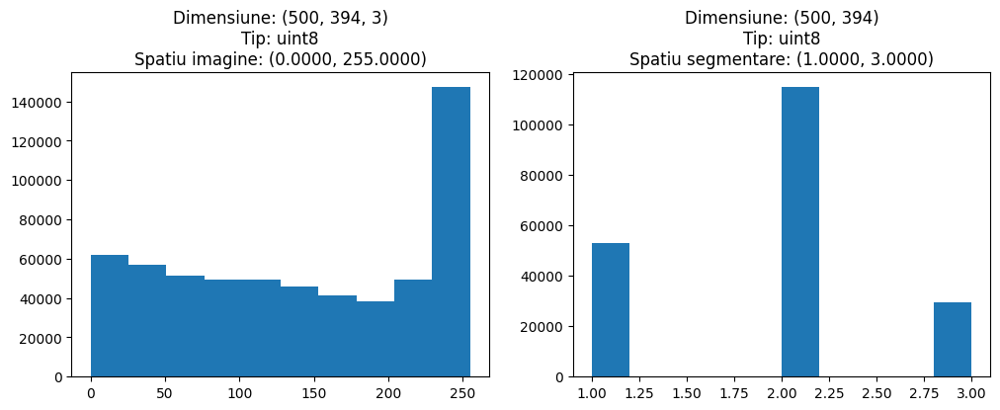

In [9]:
ex_img = np.array(ex_item[0])
ex_mask = np.array(ex_item[1])

print("Img:", vtk.img_to_str(ex_img))
print("Mask:", ex_mask)

vtk.compute_stats(ex_img, ex_mask)

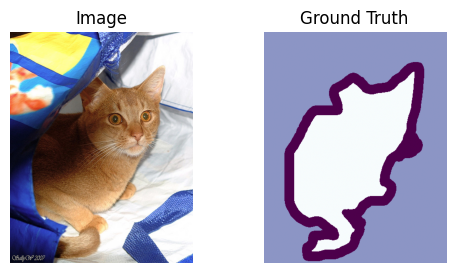

In [10]:
vtk.visualize_datapoint(ex_img, ex_mask)

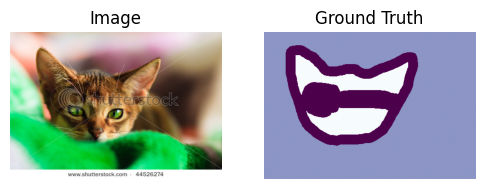

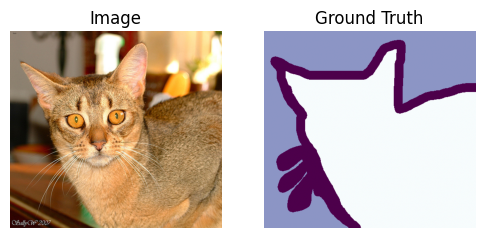

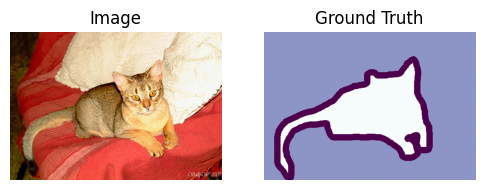

In [11]:
for i in range(1, 4):
    vtk.visualize_datapoint(
        np.array(dataset_raw[i][0]),
        np.array(dataset_raw[i][1])
    )

Observăm următoarele:
- clasa 1 este asociata animăluțului
- clasa 2 este asociata fundalului
- clasa 3 este asociata conturului

Dorim să segmentăm doar animăluțul, deci o strategie ar fi să considerăm toți pixelii contur ca făcând parte din animăluț.

Mai observam că imaginile au diferite dimensiuni. În general, pentru a facilita antrenamentul pe mai multe date în paralel, este necesar să avem o dimensiune comună a datelor. O soluție pentru a avea aceeași dimensiune a imaginilor este să aplicăm câteva transformări, precum central crop și redimensionare, atât pe imaginile date, cât și pe măștile de segmentare.

Alte transformări pe care le vom aplica sunt scalarea datelor pe un anumit interval (normalizarea datelor) pentru operații numerice mai eficiente.

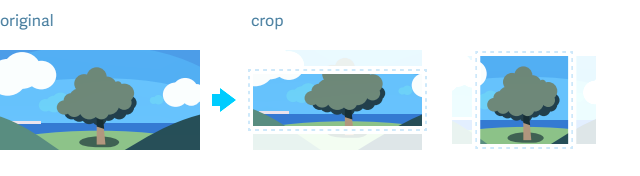

In [49]:
image_size = 128

def center_crop(img: Image):
    """
    Performs a center crop on the input image based on the minimum dimension.
    """
    return transforms.CenterCrop(min(img.width, img.height))(img)

img_transform = transforms.Compose([
    center_crop,
    transforms.Resize(
        image_size, interpolation=transforms.InterpolationMode.BILINEAR
    ),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.5), std=(0.5)), # [0, 1] -> [-1, 1]
])

def process_mask(mask: Image):
    """
    Maps the classes of the mask.
    """
    np_mask = np.array(mask)

    # transformam clasele in 0 ptr background, 1 ptr animalut
    np_mask[np_mask == 1] = 1 # animalut
    np_mask[np_mask == 2] = 0 # background
    np_mask[np_mask == 3] = 1 # contur -> animalut

    torch_mask = torch.tensor(np_mask).float()
    return torch_mask.unsqueeze(0) # (H, W) -> (1, H, W)


target_transform = transforms.Compose([
    center_crop,
    transforms.Resize(image_size, interpolation=transforms.InterpolationMode.NEAREST),
    process_mask,
])

dataset = torchvision.datasets.OxfordIIITPet(
    root="./",
    target_types="segmentation",
    split='trainval',
    download=True,
    transform=img_transform,
    target_transform=target_transform
)
dataset = Subset(dataset, range(2560)) # selectam un subset de 2560 de elemente
print("Lungime dataset:", len(dataset))

Lungime dataset: 2560


In [50]:
ex_item = dataset[0]
print("Exemplu imagine:", ex_item[0])
print("Exemplu masca:", ex_item[1])

Exemplu imagine: tensor([[[-0.5451, -0.5451, -0.5373,  ...,  0.9529,  0.9059,  0.9373],
         [-0.5373, -0.5373, -0.5294,  ...,  0.9373,  0.8980,  0.9451],
         [-0.5608, -0.5529, -0.5451,  ...,  0.9216,  0.8980,  0.9373],
         ...,
         [-0.7961, -0.7961, -0.7882,  ...,  1.0000,  1.0000,  1.0000],
         [-0.8039, -0.8039, -0.8039,  ...,  0.9922,  0.9922,  1.0000],
         [-0.8118, -0.8118, -0.8118,  ...,  1.0000,  1.0000,  1.0000]],

        [[-0.1686, -0.1765, -0.1529,  ...,  0.9451,  0.8980,  0.9294],
         [-0.1922, -0.1686, -0.1373,  ...,  0.9294,  0.8902,  0.9373],
         [-0.2627, -0.2157, -0.2000,  ...,  0.9137,  0.8902,  0.9294],
         ...,
         [-0.7725, -0.7804, -0.7725,  ...,  1.0000,  1.0000,  1.0000],
         [-0.7882, -0.7882, -0.7882,  ...,  0.9922,  0.9922,  1.0000],
         [-0.8118, -0.8039, -0.7961,  ...,  1.0000,  1.0000,  1.0000]],

        [[ 0.7804,  0.7647,  0.7882,  ...,  0.9843,  0.9373,  0.9686],
         [ 0.7804,  0.7647, 

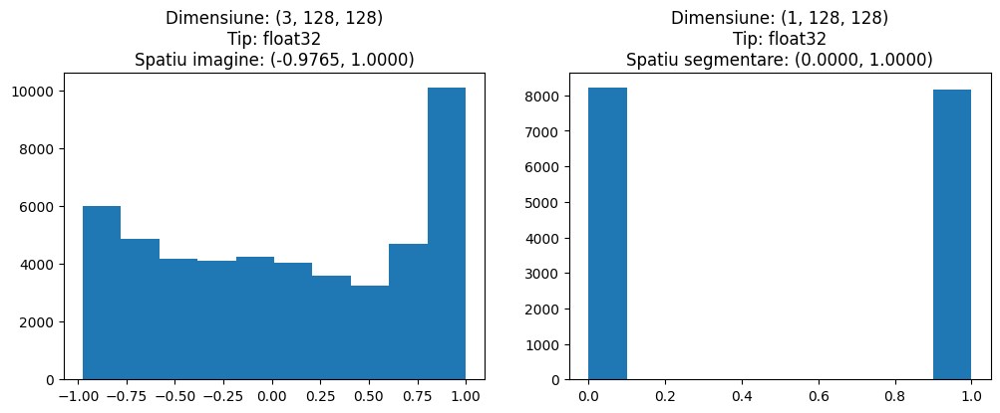

In [51]:
ex_img = ex_item[0].numpy()
ex_mask = ex_item[1].numpy()

vtk.compute_stats(ex_img, ex_mask)

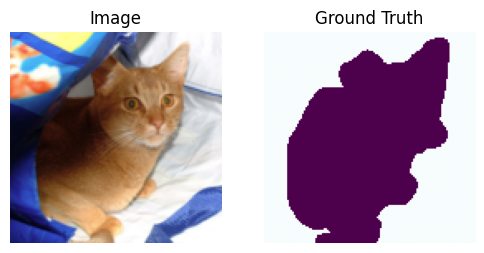

In [52]:
def postprocess_img(img: np.ndarray):
    img = (img + 1) / 2
    img = np.clip(img, 0, 1)
    img = np.transpose(img, (1, 2, 0)) # (3, H, W) -> (H, W, 3)
    return img

def postprocess_mask(mask: np.ndarray):
    threshold = 0.5
    mask = np.array(mask > threshold, dtype=np.int32)
    return mask.squeeze()

vtk.visualize_datapoint(
    postprocess_img(ex_img),
    postprocess_mask(ex_mask)
)

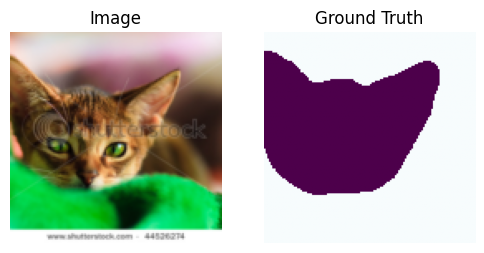

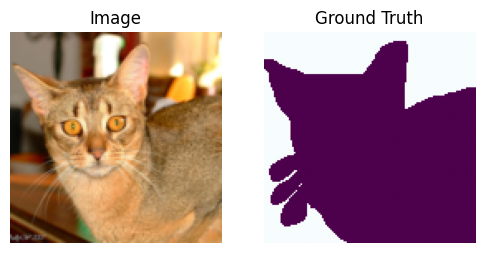

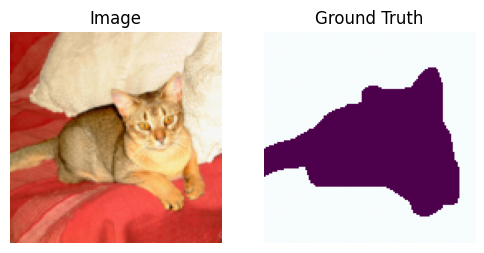

In [53]:
for i in range(1, 4):
    vtk.visualize_datapoint(
        postprocess_img(dataset[i][0].numpy()),
        postprocess_mask(dataset[i][1].numpy())
    )

### *Cât de bună este masca de segmentare?* - Metrici de evaluare
- **Intersection over Union (IoU):** (cunoscut și ca Jaccard Index)
  - Măsoară suprapunerea dintre segmentarea prevăzută și realitate.
  - Valori in intervalul [0, 1].
  - O segmentare perfectă înseamnă IoU = 1.0 (suprapunere 100%).
  - Formulă:
$$
\text{IoU} = \frac{TP}{TP + FP + FN}
$$
    * TP (True Positives): pixeli prezisi corect ca foreground (prim-plan).
    * FP (False Positives): pixeli de fundal prezisi în mod eronat ca fiind foreground.
    * FN (False Negatives): pixeli din foreground omisi (prezisi ca fundal).
  
iou.avif

iou-2.avif

*[image source]([[source=https://www.v7labs.com/blog/image-segmentation-guide]])*

In [54]:
def compute_miou(preds: np.ndarray, masks: np.ndarray):
    iou_values_per_class = []

    for cls in np.unique(masks): # pentru fiecare clasa din masca - animalut si background
        predicted_cls = preds == cls # returneaza un array cu acelasi shape cu True pentru valorile egale, False pentru cele inegale
        mask_cls = masks == cls # la fel ca mai sus
        intersection = (predicted_cls & mask_cls).sum() # elementele care sunt egale cu clasa si in predictie, si in ground truth
        union = (predicted_cls | (masks == cls)).sum() # elementele care sunt egale cu clasa fie in predictie, fie in ground truth
        iou = intersection / union
        iou_values_per_class.append(iou)

    return np.mean(iou_values_per_class) # calculam media aritmetica pentru fiecare clasa

- **Dice Similarity Coefficient (DSC):**
  - Măsoară similitudinea dintre două seturi (predicție și realitate), favorizând suprapunerea.
  - Similar cu IoU, dar acordă mai multă importanță zonelor de suprapunere.
  - Valori in intervalul [0, 1].
  - Formulă:
$$
\text{DSC} = \frac{2TP}{2TP + FP + FN}
$$

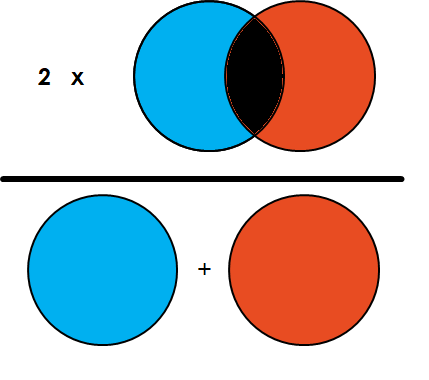

Sursa: [kaggle](https://www.kaggle.com/code/yerramvarun/understanding-dice-coefficient)

In [55]:
def compute_dice(preds: np.ndarray, masks: np.ndarray):
    dice_values_per_class = []

    for cls in np.unique(masks):
        predicted_cls = preds == cls
        mask_cls = masks == cls
        intersection = (predicted_cls & mask_cls).sum()
        dice = 2 * intersection / (predicted_cls.sum() + mask_cls.sum())
        dice_values_per_class.append(dice)

    return np.mean(dice_values_per_class)

- **Pixel Accuracy (PA):**
  - Măsoară procentul de pixeli clasificați corect din totalul pixelilor.
  - Valori in intervalul [0, 1].
  - Poate fi înșelător dacă fundalul domină imaginea (de exemplu, 95% fundal → PA ridicat chiar și cu segmentare slabă).
  - Formulă:
$$
PA = \frac{TP}{TP + TN + FP + FN}
$$
  - **Hint**: Pixelii clasificați corect (adică intersecția) supra numărul total de pixeli.

In [56]:
def compute_pixel_acc(preds: np.ndarray, masks: np.ndarray):
    pixel_acc_values_per_class = []

    for cls in np.unique(masks):
        # TODO
        predicted_cls = preds == cls
        mask_cls = masks == cls
        intersection = (predicted_cls & mask_cls).sum()
        total_pixels = np.prod(predicted_cls.shape)
        pixel_acc = intersection / total_pixels
        # END TODO
        pixel_acc_values_per_class.append(pixel_acc)

    return np.mean(pixel_acc_values_per_class)

## Antrenarea unui model

### Împărțirea dataset-ului

Pentru a putea validă că modelul nostru nu este *"overfitted"* pe setul de date, vom împărți datele în 2 submulțimi:
- setul de antrenament *(train_dataset)*: această submulțime este folosită de model pentru a învăța să rezolve problema de segmentare a imaginilor.
- setul de validare *(val_dataset)*: această submulțime este folosită pentru a valida performanța modelului, date pe care modelul nu le va folosi în etapa de învățare.

In [57]:
train_len = int(0.8 * len(dataset))
val_len = len(dataset) - train_len

train_dataset, val_dataset = random_split(dataset, [train_len, val_len])
print("Lungime train:", len(train_dataset))
print("Lungime validation:", len(val_dataset))

Lungime train: 2048
Lungime validation: 512


### Dataloader

Mometan datele noastre se află într-o structura de tip *Dataset*. Pentru a putea antrena date în batch-uri ([mini-batch training](https://www.geeksforgeeks.org/deep-learning/mini-batch-gradient-descent-in-deep-learning/)) și pentru a avea datele într-o ordine aleatoare, PyTorch ne oferă la dispoziție clasa **_DataLoader_** pentru a ajusta acești parametrii.

In [58]:
batch_size = 64
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

print("Lungime train loader:", len(train_loader))
print("Lungime validation loader:", len(val_loader))

Lungime train loader: 32
Lungime validation loader: 8


In [59]:
for item in train_loader:
    print(item[0].shape)
    print(item[1].shape)
    break


torch.Size([64, 3, 128, 128])
torch.Size([64, 1, 128, 128])


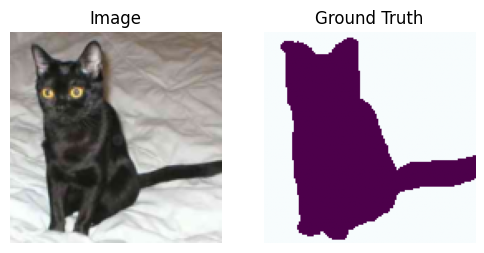

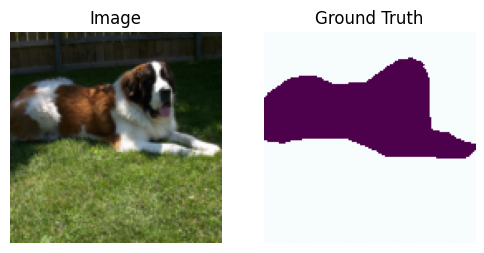

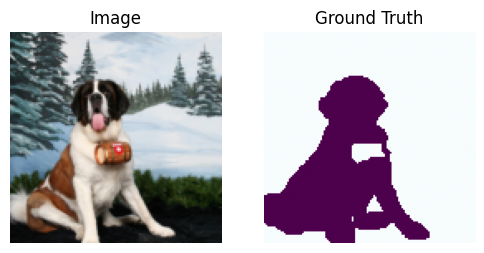

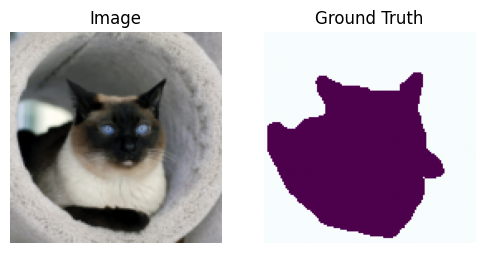

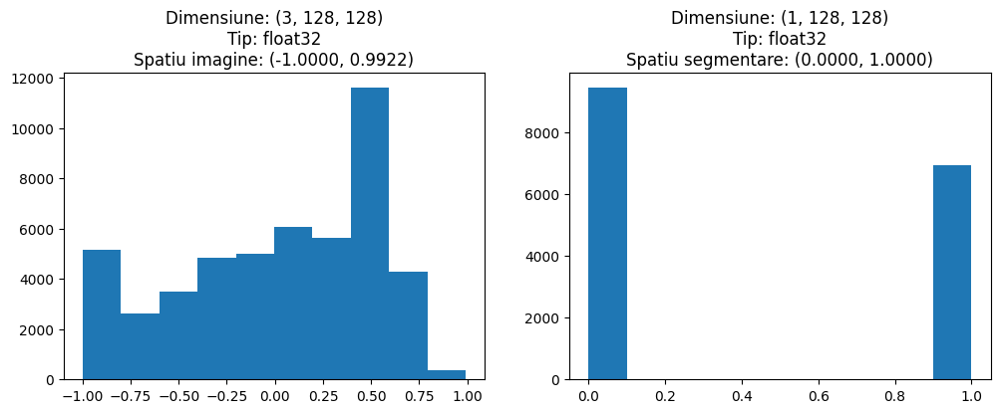

In [60]:
for (images, masks) in train_loader:
    for idx in range(4):
        ex_img = images[idx].numpy()
        ex_mask = masks[idx].numpy()
        vtk.visualize_datapoint(
            postprocess_img(ex_img), postprocess_mask(ex_mask)
        )
    vtk.compute_stats(ex_img, ex_mask)
    break

## Antrenament

In [61]:
class SegmentationTrainer:
    def __init__(
        self,
        model: nn.Module,
        optimizer: optim.Optimizer,
        log_iterations: dict[str, int],
        device: torch.device = torch.device("cpu"),
    ):
        self.model = model
        self.optimizer = optimizer
        self.loss_criterion = nn.BCEWithLogitsLoss()
        self.log_iterations = log_iterations
        self.device = device
        self.stats = {
            "train": {"miou": [], "dice": [], "pixel_acc": [], "loss": []},
            "val": {"miou": [], "dice": [], "pixel_acc": [], "loss": []},
        }

    def train_batch(self, images: torch.Tensor, masks: torch.Tensor):
        images = images.to(self.device)
        masks = masks.to(self.device)

        self.optimizer.zero_grad() # reset the optimizer
        preds = self.model(images) # forward propagation - set the gradients
        loss = self.loss_criterion(preds, masks)

        loss.backward() # backpropagation - compute the steps towards the better weights based on the loss and the gradients
        self.optimizer.step() # update the weights

        return preds.detach().cpu(), loss.item()

    def validate_batch(self, images: torch.Tensor, masks: torch.Tensor):
        images = images.to(self.device)
        masks = masks.to(self.device)

        preds = self.model(images) # forward propagation - the gradients are not set because @torch.no_grad()
        loss = self.loss_criterion(preds, masks)

        return preds.detach().cpu(), loss.item()

    def log_metrics(
        self,
        idx: int,
        split: str, # "train" | "val"
        images: np.ndarray,
        masks: np.ndarray,
        preds: np.ndarray,
        loss: float,
    ):
        preds = preds > 0.5 # apply some threshold
        miou = compute_miou(preds.numpy(), masks.numpy())
        dice = compute_dice(preds.numpy(), masks.numpy())
        pixel_acc = compute_pixel_acc(preds.numpy(), masks.numpy())

        self.stats[split]["miou"].append(miou)
        self.stats[split]["dice"].append(dice)
        self.stats[split]["pixel_acc"].append(pixel_acc)
        self.stats[split]["loss"].append(loss)

        if (idx + 1) % self.log_iterations[split] == 0 or idx == 0:
            print(
                f"{split} epoch: {epoch+1} - iteration {idx+1}:"
                f"\n - miou: {np.mean(self.stats[split]['miou'][-10:]):.6f}"
                f"\n - dice: {np.mean(self.stats[split]['dice'][-10:]):.6}"
                f"\n - pixel accuracy: {np.mean(self.stats[split]['pixel_acc'][-10:]):.6}"
                f"\n - loss: {np.mean(self.stats[split]['loss'][-10:]):.6}"
            )
            viz_image = postprocess_img(images[0].numpy())
            viz_mask = postprocess_mask(masks[0].numpy())
            viz_output = postprocess_mask(preds[0].numpy())
            vtk.visualize_datapoint(viz_image, viz_mask, viz_output)

    def train_loader(self, train_loader: DataLoader):
        model.train()
        for idx, (images, masks) in enumerate(train_loader):
            preds, loss = self.train_batch(images, masks)
            self.log_metrics(idx, "train", images, masks, preds, loss)

    @torch.no_grad()
    def validate_loader(self, val_loader: DataLoader):
        model.eval()
        for idx, (images, masks) in enumerate(val_loader):
            preds, loss = self.validate_batch(images, masks)
            self.log_metrics(idx, "val", images, masks, preds, loss)

## Arhitectura: U-Net


# 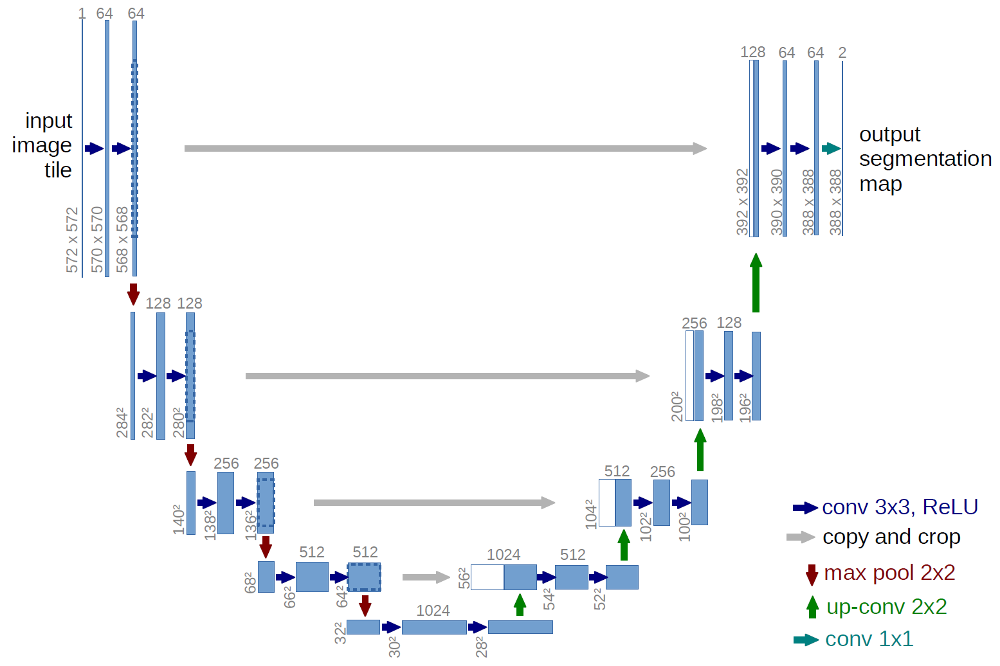

In [64]:
class DoubleConv(nn.Module):
    def __init__(self, in_channels: int, out_channels: int):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x: torch.Tensor):
        return self.conv(x)

class UNet(nn.Module):
    def __init__(self, in_channels: int = 3, out_channels: int = 1, scale: int = 64):
        super().__init__()
        self.enc1 = DoubleConv(in_channels, scale)
        self.enc2 = DoubleConv(scale, scale * 2)
        self.enc3 = DoubleConv(scale * 2, scale * 4)
        self.enc4 = DoubleConv(scale * 4, scale * 8)

        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

        self.up3 = nn.ConvTranspose2d(scale * 8, scale * 4, kernel_size=2, stride=2)
        self.dec3 = DoubleConv(scale * 8, scale * 4)
        self.up2 = nn.ConvTranspose2d(scale * 4, scale * 2, kernel_size=2, stride=2)
        self.dec2 = DoubleConv(scale * 4, scale * 2)
        self.up1 = nn.ConvTranspose2d(scale * 2, scale, kernel_size=2, stride=2)
        self.dec1 = DoubleConv(scale * 2, scale)

        self.final = nn.Conv2d(scale, out_channels, kernel_size=1)

    def forward(self, x: torch.Tensor):
        # TODO: partea asta poate fi completata
        e1 = self.enc1(x) #
        e2 = self.enc2(self.pool(e1)) #
        e3 = self.enc3(self.pool(e2)) #
        e4 = self.enc4(self.pool(e3)) #

        d3 = self.up3(e4) #
        d3 = torch.cat([d3, e3], dim=1) #
        d3 = self.dec3(d3) #

        d2 = self.up2(d3) #
        d2 = torch.cat([d2, e2], dim=1) #
        d2 = self.dec2(d2) #

        d1 = self.up1(d2) #
        d1 = torch.cat([d1, e1], dim=1) #
        d1 = self.dec1(d1) #

        return self.final(d1) #

In [65]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNet().to(device)
optimizer = optim.Adam(model.parameters(), lr=1e-5, weight_decay=1e-3)

print("Device:", device)

Device: cuda


train epoch: 1 - iteration 1:
 - miou: 0.254091
 - dice: 0.337005
 - pixel accuracy: 0.254054
 - loss: 0.73813


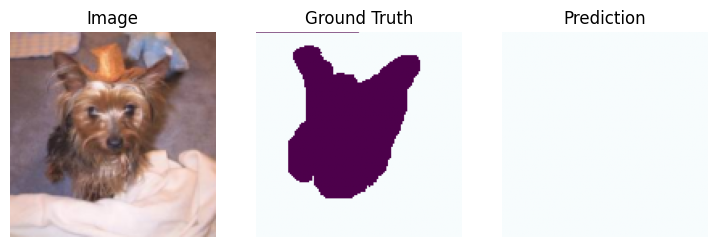

train epoch: 1 - iteration 16:
 - miou: 0.252437
 - dice: 0.335389
 - pixel accuracy: 0.252371
 - loss: 0.72399


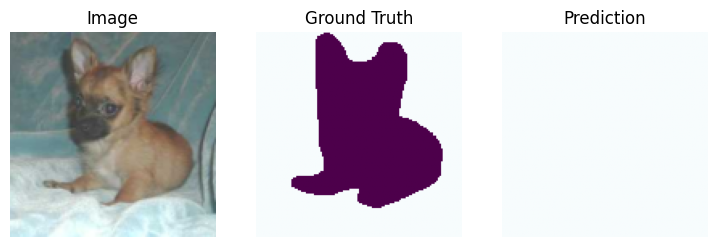

train epoch: 1 - iteration 32:
 - miou: 0.258287
 - dice: 0.341049
 - pixel accuracy: 0.257913
 - loss: 0.691997


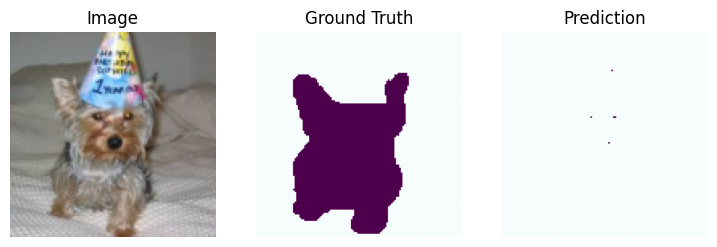

val epoch: 1 - iteration 1:
 - miou: 0.237342
 - dice: 0.321889
 - pixel accuracy: 0.237342
 - loss: 0.706201


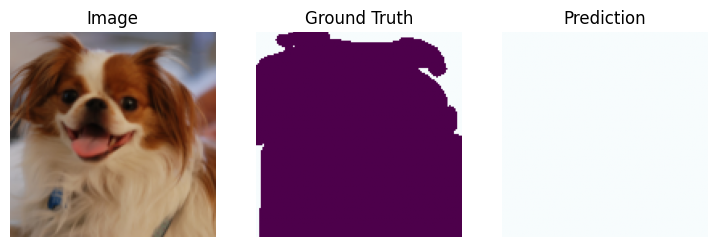

val epoch: 1 - iteration 8:
 - miou: 0.242371
 - dice: 0.326211
 - pixel accuracy: 0.242371
 - loss: 0.704133


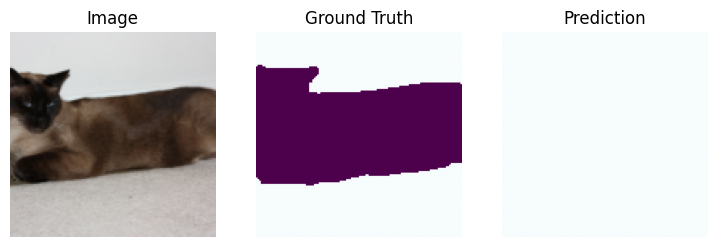

train epoch: 2 - iteration 1:
 - miou: 0.256983
 - dice: 0.339984
 - pixel accuracy: 0.256578
 - loss: 0.692289


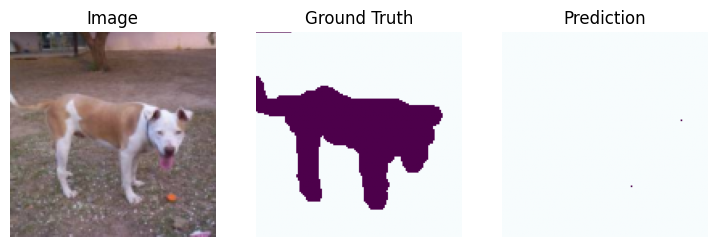

train epoch: 2 - iteration 16:
 - miou: 0.253280
 - dice: 0.338437
 - pixel accuracy: 0.251724
 - loss: 0.671698


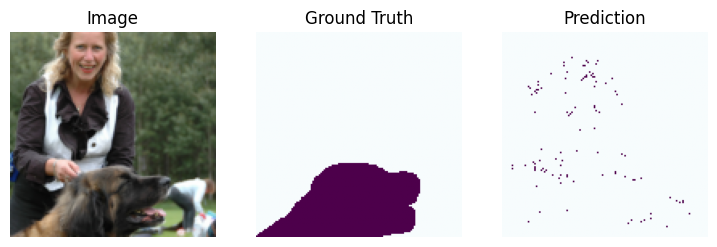

train epoch: 2 - iteration 32:
 - miou: 0.263475
 - dice: 0.352579
 - pixel accuracy: 0.258212
 - loss: 0.636206


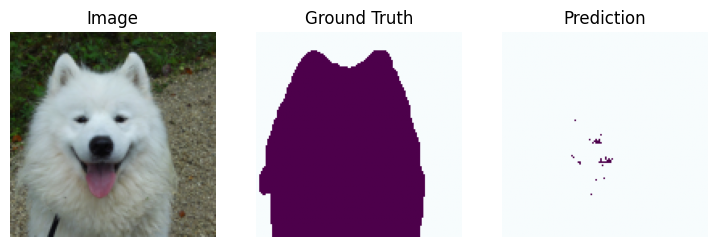

val epoch: 2 - iteration 1:
 - miou: 0.243364
 - dice: 0.328532
 - pixel accuracy: 0.2424
 - loss: 0.695704


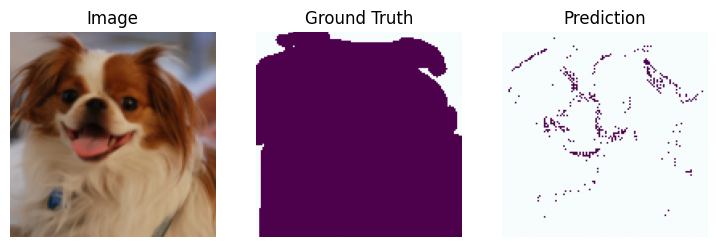

val epoch: 2 - iteration 8:
 - miou: 0.258052
 - dice: 0.351131
 - pixel accuracy: 0.250481
 - loss: 0.641609


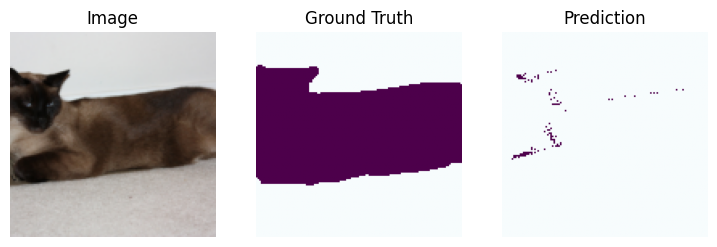

train epoch: 3 - iteration 1:
 - miou: 0.264148
 - dice: 0.353774
 - pixel accuracy: 0.258437
 - loss: 0.633227


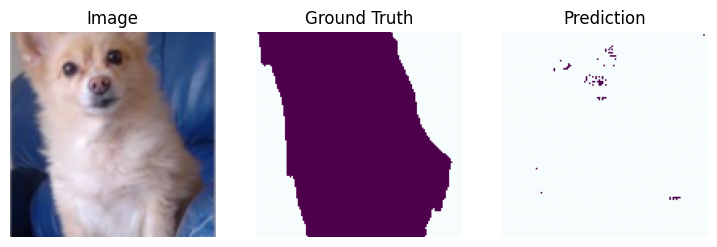

train epoch: 3 - iteration 16:
 - miou: 0.284489
 - dice: 0.389461
 - pixel accuracy: 0.265059
 - loss: 0.594483


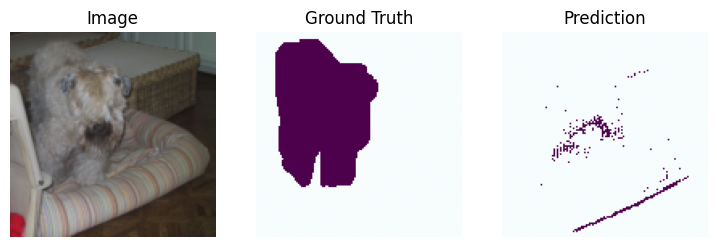

train epoch: 3 - iteration 32:
 - miou: 0.357913
 - dice: 0.498003
 - pixel accuracy: 0.291837
 - loss: 0.556649


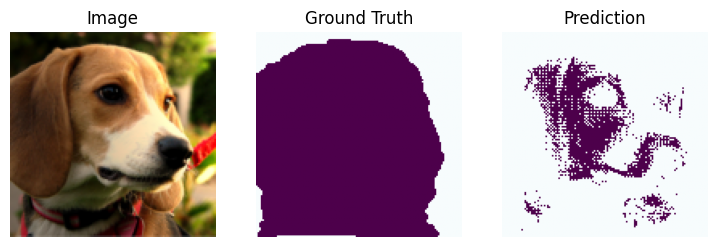

val epoch: 3 - iteration 1:
 - miou: 0.273431
 - dice: 0.374554
 - pixel accuracy: 0.254506
 - loss: 0.628163


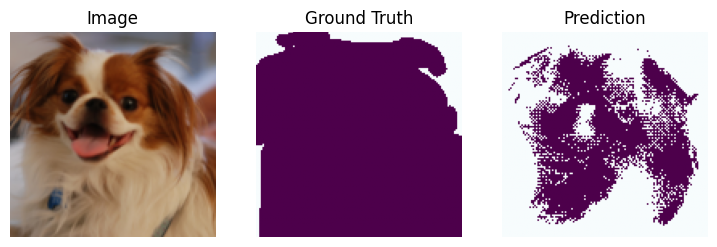

val epoch: 3 - iteration 8:
 - miou: 0.398181
 - dice: 0.544927
 - pixel accuracy: 0.304125
 - loss: 0.557742


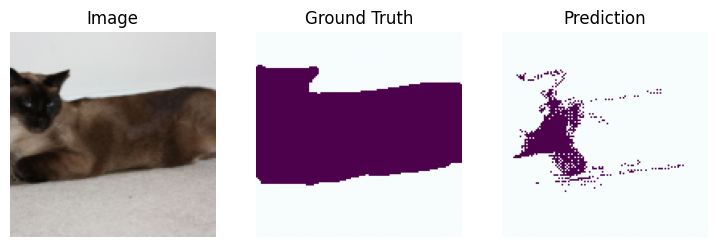

train epoch: 4 - iteration 1:
 - miou: 0.359507
 - dice: 0.501473
 - pixel accuracy: 0.291235
 - loss: 0.558085


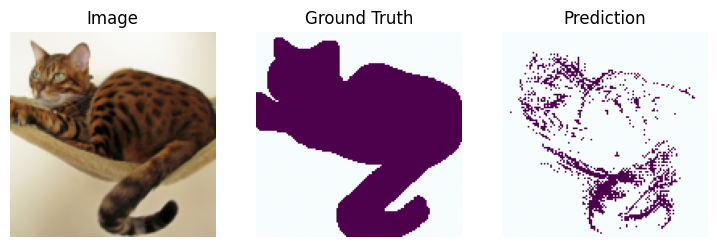

train epoch: 4 - iteration 16:
 - miou: 0.457759
 - dice: 0.615766
 - pixel accuracy: 0.329425
 - loss: 0.510293


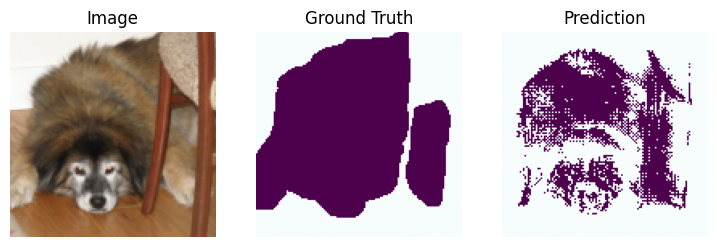

train epoch: 4 - iteration 32:
 - miou: 0.523079
 - dice: 0.68131
 - pixel accuracy: 0.351735
 - loss: 0.491524


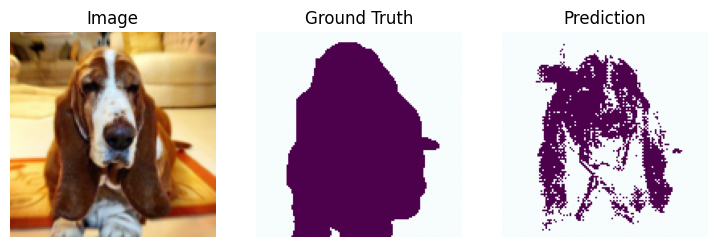

val epoch: 4 - iteration 1:
 - miou: 0.416124
 - dice: 0.569866
 - pixel accuracy: 0.309348
 - loss: 0.549647


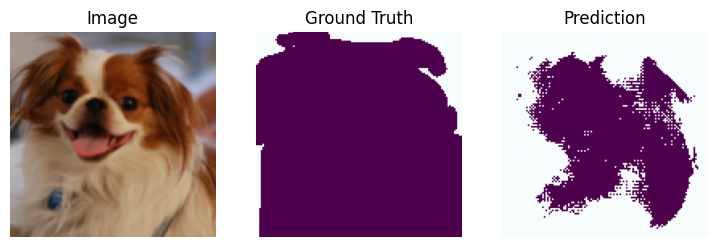

val epoch: 4 - iteration 8:
 - miou: 0.462675
 - dice: 0.623065
 - pixel accuracy: 0.32836
 - loss: 0.520205


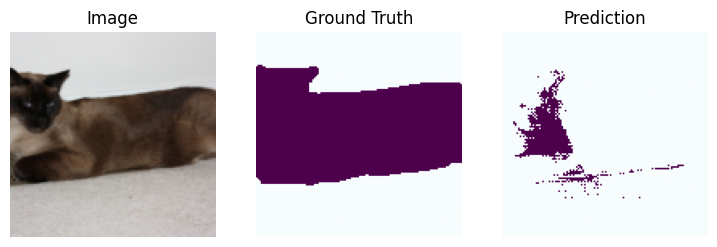

train epoch: 5 - iteration 1:
 - miou: 0.531300
 - dice: 0.688714
 - pixel accuracy: 0.355086
 - loss: 0.487528


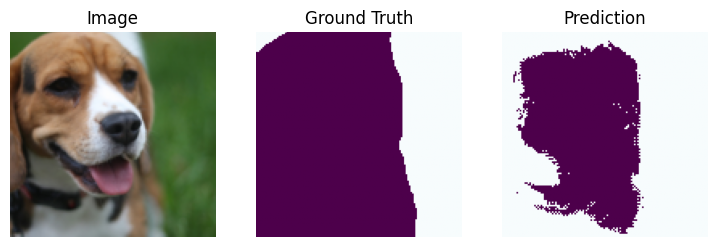

train epoch: 5 - iteration 16:
 - miou: 0.567920
 - dice: 0.721644
 - pixel accuracy: 0.366901
 - loss: 0.468838


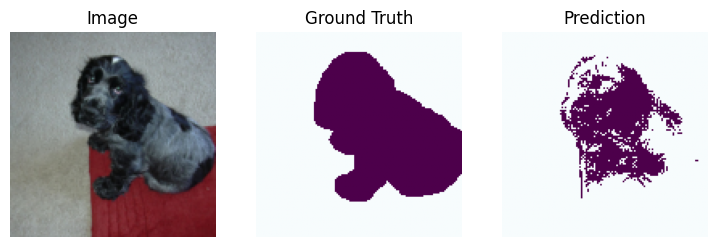

train epoch: 5 - iteration 32:
 - miou: 0.602462
 - dice: 0.749917
 - pixel accuracy: 0.37956
 - loss: 0.451367


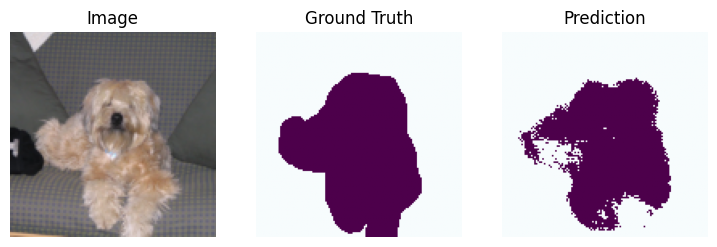

val epoch: 5 - iteration 1:
 - miou: 0.467398
 - dice: 0.628459
 - pixel accuracy: 0.32926
 - loss: 0.519787


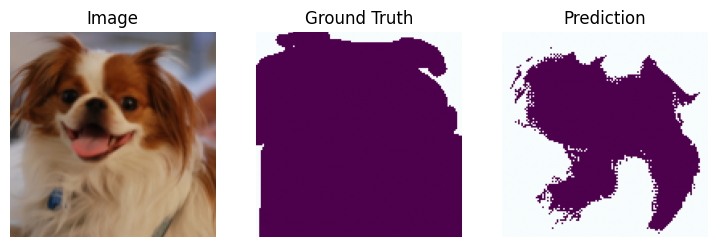

val epoch: 5 - iteration 8:
 - miou: 0.507318
 - dice: 0.666837
 - pixel accuracy: 0.345007
 - loss: 0.493894


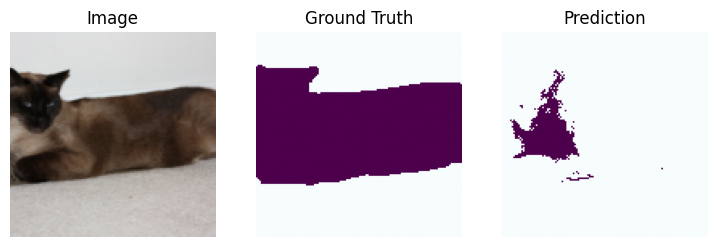

train epoch: 6 - iteration 1:
 - miou: 0.607059
 - dice: 0.753408
 - pixel accuracy: 0.381438
 - loss: 0.449395


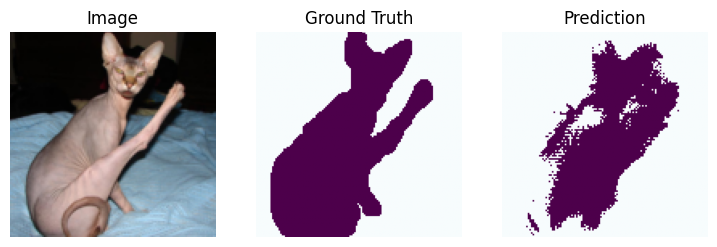

train epoch: 6 - iteration 16:
 - miou: 0.630552
 - dice: 0.772102
 - pixel accuracy: 0.389214
 - loss: 0.432188


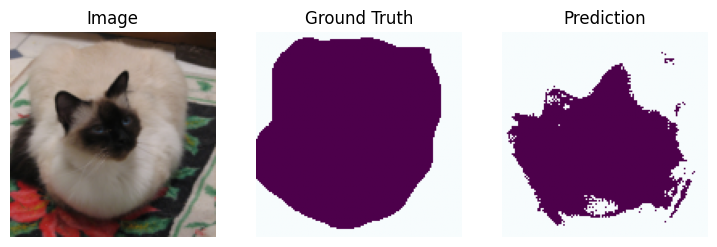

train epoch: 6 - iteration 32:
 - miou: 0.655392
 - dice: 0.790785
 - pixel accuracy: 0.398087
 - loss: 0.41558


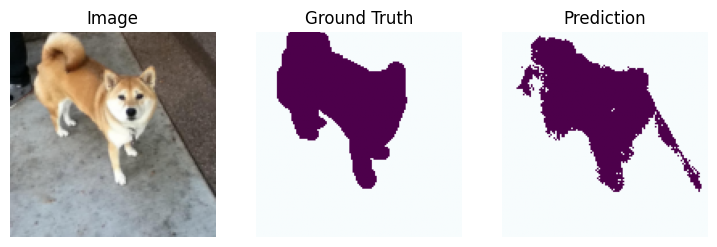

val epoch: 6 - iteration 1:
 - miou: 0.519100
 - dice: 0.677614
 - pixel accuracy: 0.348544
 - loss: 0.4895


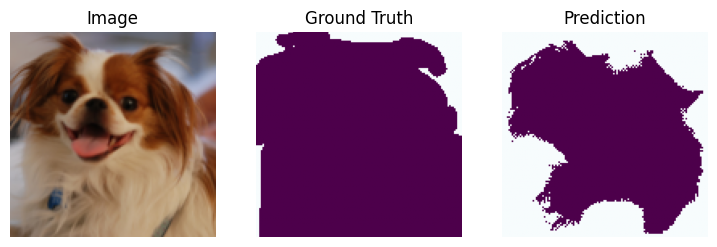

val epoch: 6 - iteration 8:
 - miou: 0.597669
 - dice: 0.745383
 - pixel accuracy: 0.377382
 - loss: 0.446206


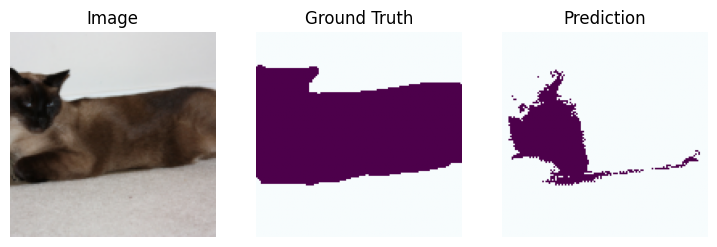

train epoch: 7 - iteration 1:
 - miou: 0.656877
 - dice: 0.791908
 - pixel accuracy: 0.398639
 - loss: 0.413617


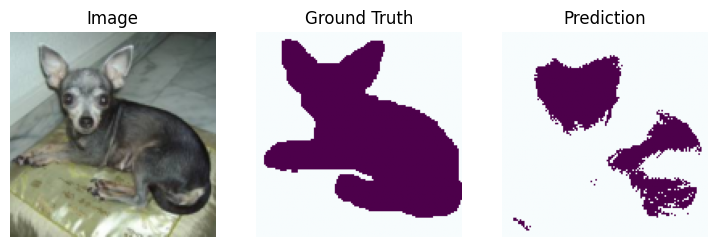

train epoch: 7 - iteration 16:
 - miou: 0.654695
 - dice: 0.790327
 - pixel accuracy: 0.397402
 - loss: 0.411284


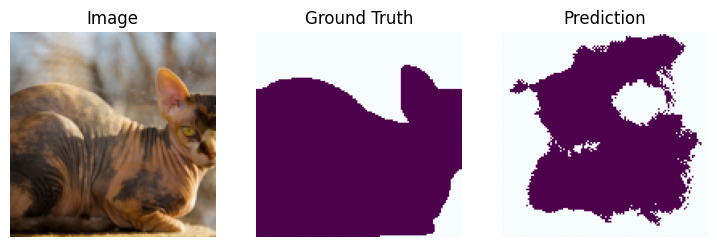

train epoch: 7 - iteration 32:
 - miou: 0.667378
 - dice: 0.799858
 - pixel accuracy: 0.40146
 - loss: 0.404905


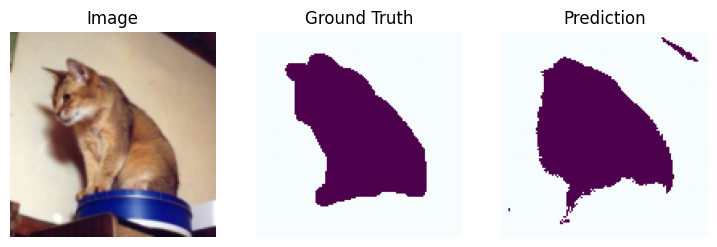

val epoch: 7 - iteration 1:
 - miou: 0.607815
 - dice: 0.753932
 - pixel accuracy: 0.380319
 - loss: 0.443112


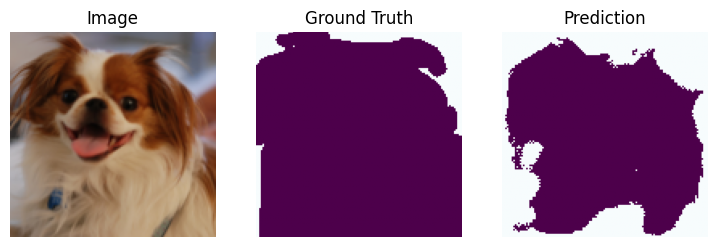

val epoch: 7 - iteration 8:
 - miou: 0.651378
 - dice: 0.788169
 - pixel accuracy: 0.395595
 - loss: 0.419913


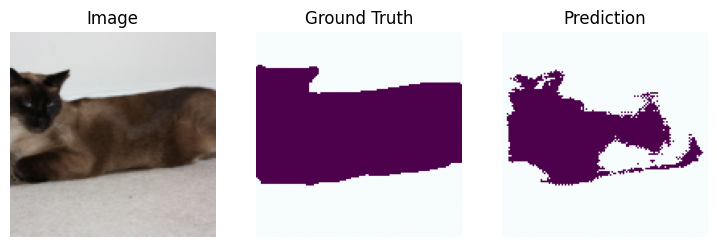

train epoch: 8 - iteration 1:
 - miou: 0.663721
 - dice: 0.797235
 - pixel accuracy: 0.400091
 - loss: 0.406579


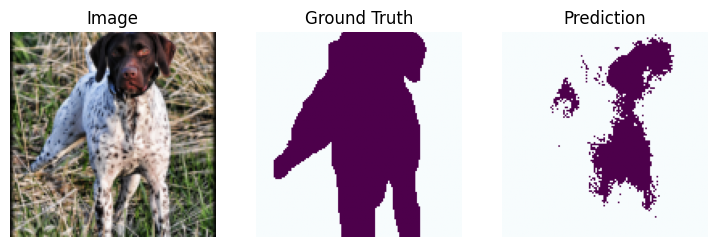

train epoch: 8 - iteration 16:
 - miou: 0.669153
 - dice: 0.80116
 - pixel accuracy: 0.402158
 - loss: 0.398914


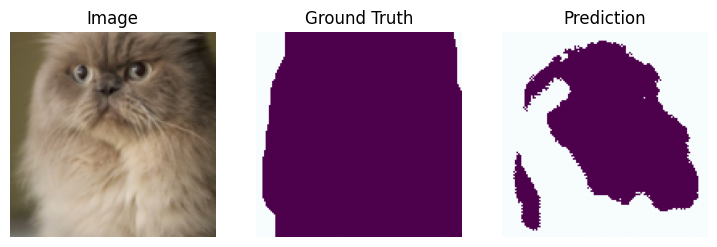

train epoch: 8 - iteration 32:
 - miou: 0.692063
 - dice: 0.81749
 - pixel accuracy: 0.410072
 - loss: 0.384005


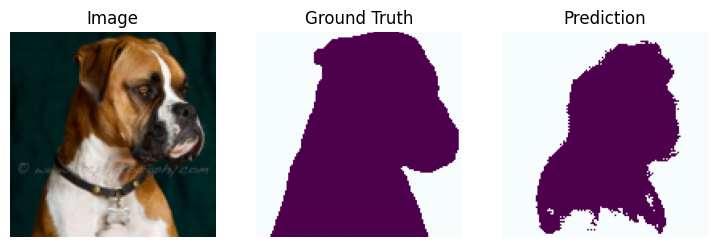

val epoch: 8 - iteration 1:
 - miou: 0.651584
 - dice: 0.788459
 - pixel accuracy: 0.395353
 - loss: 0.419966


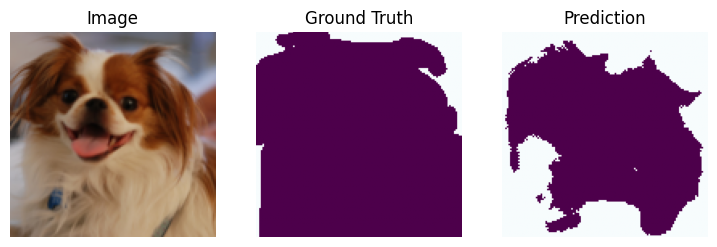

val epoch: 8 - iteration 8:
 - miou: 0.660750
 - dice: 0.795187
 - pixel accuracy: 0.398861
 - loss: 0.410275


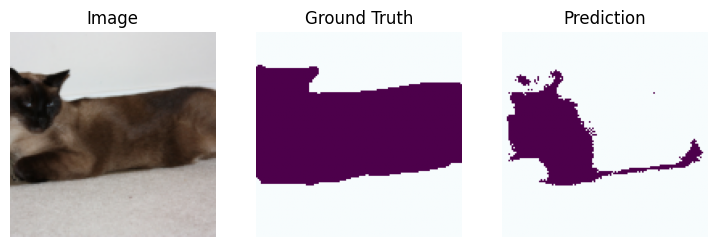

train epoch: 9 - iteration 1:
 - miou: 0.694308
 - dice: 0.819027
 - pixel accuracy: 0.410838
 - loss: 0.381591


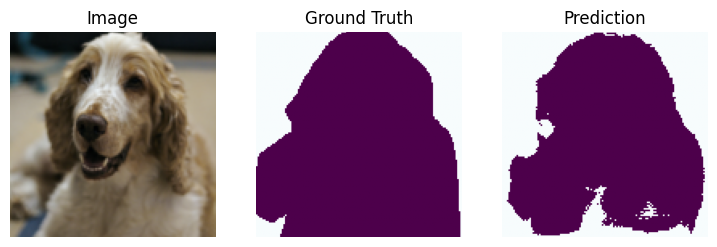

train epoch: 9 - iteration 16:
 - miou: 0.695272
 - dice: 0.819814
 - pixel accuracy: 0.411077
 - loss: 0.378428


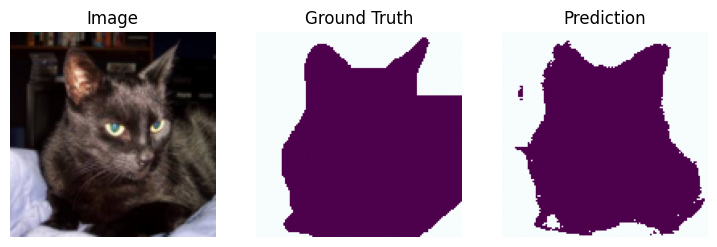

train epoch: 9 - iteration 32:
 - miou: 0.687796
 - dice: 0.814461
 - pixel accuracy: 0.408424
 - loss: 0.380924


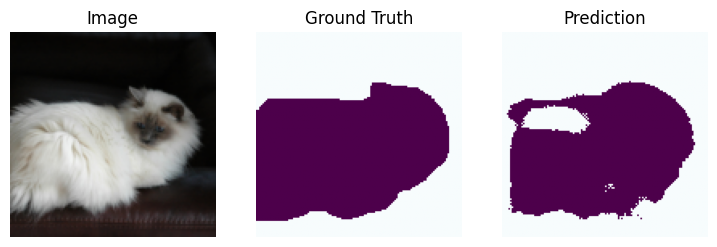

val epoch: 9 - iteration 1:
 - miou: 0.661452
 - dice: 0.795742
 - pixel accuracy: 0.398954
 - loss: 0.408509


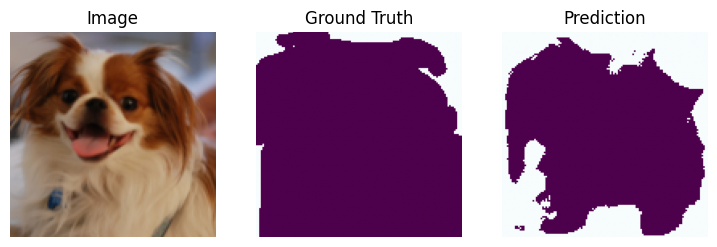

val epoch: 9 - iteration 8:
 - miou: 0.684886
 - dice: 0.812611
 - pixel accuracy: 0.407121
 - loss: 0.393662


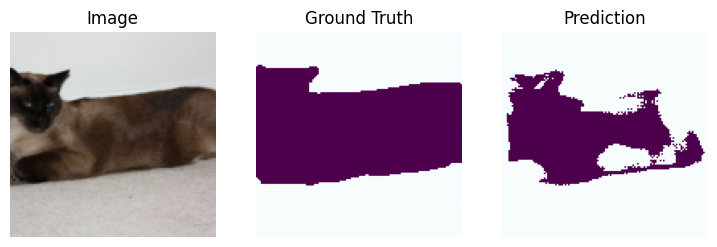

train epoch: 10 - iteration 1:
 - miou: 0.687011
 - dice: 0.813955
 - pixel accuracy: 0.408067
 - loss: 0.380942


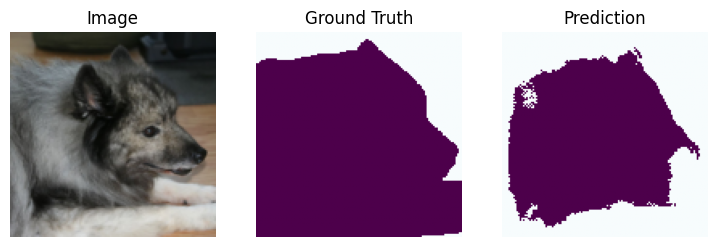

train epoch: 10 - iteration 16:
 - miou: 0.698465
 - dice: 0.821987
 - pixel accuracy: 0.41193
 - loss: 0.373991


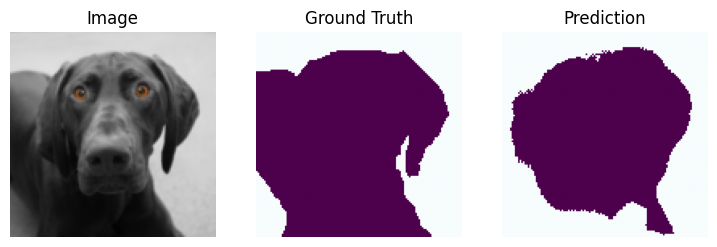

train epoch: 10 - iteration 32:
 - miou: 0.712624
 - dice: 0.831779
 - pixel accuracy: 0.416892
 - loss: 0.360533


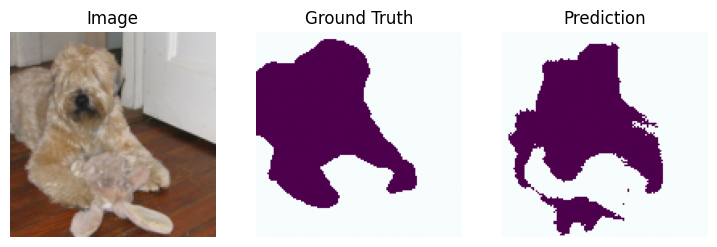

val epoch: 10 - iteration 1:
 - miou: 0.679816
 - dice: 0.808961
 - pixel accuracy: 0.405182
 - loss: 0.396372


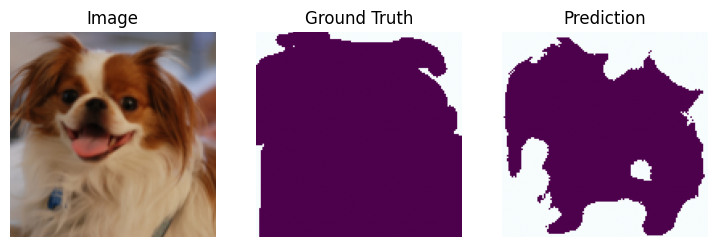

val epoch: 10 - iteration 8:
 - miou: 0.658626
 - dice: 0.793413
 - pixel accuracy: 0.398166
 - loss: 0.406813


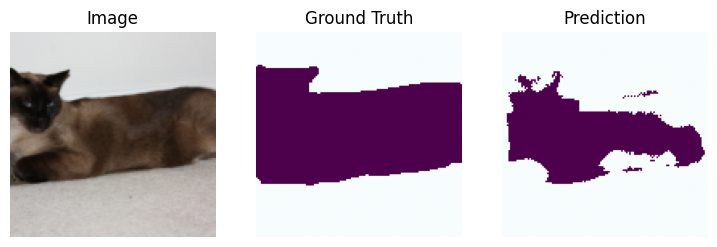

train epoch: 11 - iteration 1:
 - miou: 0.711276
 - dice: 0.830857
 - pixel accuracy: 0.416452
 - loss: 0.362246


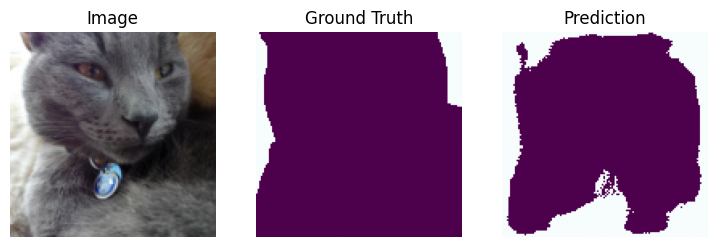

train epoch: 11 - iteration 16:
 - miou: 0.713683
 - dice: 0.832549
 - pixel accuracy: 0.417187
 - loss: 0.354838


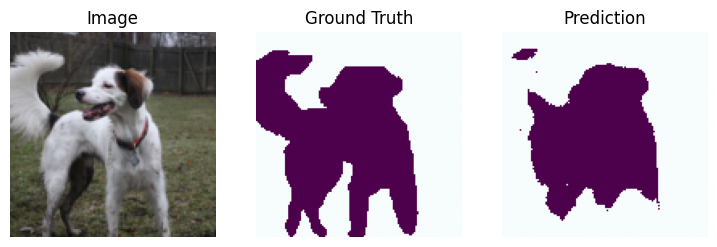

train epoch: 11 - iteration 32:
 - miou: 0.719700
 - dice: 0.836606
 - pixel accuracy: 0.419131
 - loss: 0.35317


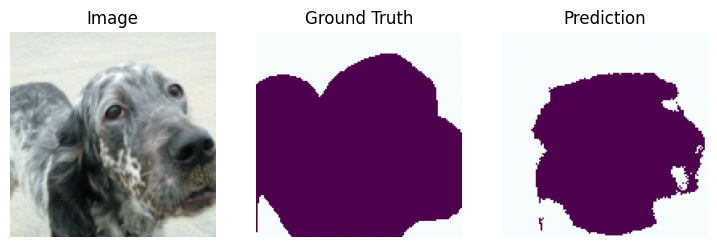

val epoch: 11 - iteration 1:
 - miou: 0.653582
 - dice: 0.789857
 - pixel accuracy: 0.39633
 - loss: 0.409009


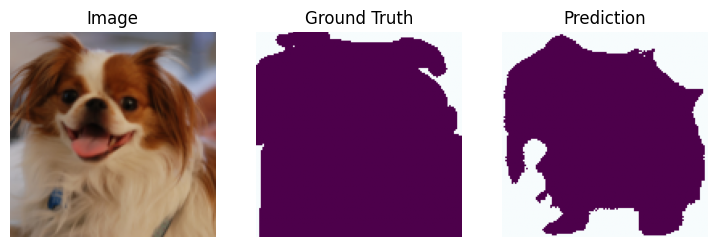

val epoch: 11 - iteration 8:
 - miou: 0.656395
 - dice: 0.791811
 - pixel accuracy: 0.397685
 - loss: 0.405104


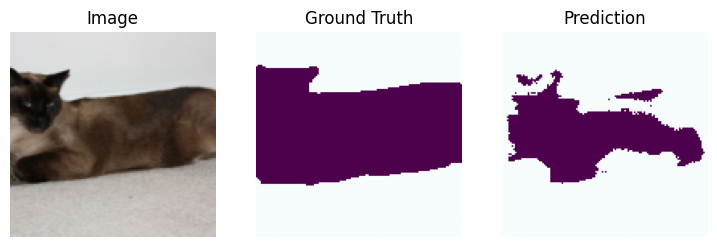

train epoch: 12 - iteration 1:
 - miou: 0.722439
 - dice: 0.838451
 - pixel accuracy: 0.420063
 - loss: 0.352455


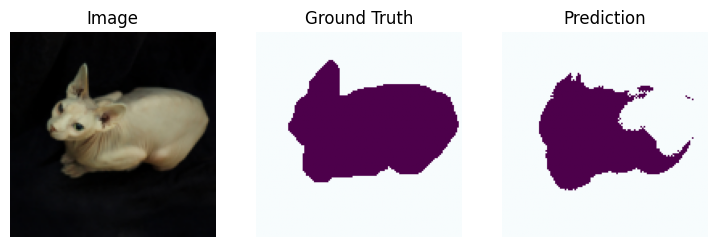

train epoch: 12 - iteration 16:
 - miou: 0.731640
 - dice: 0.844706
 - pixel accuracy: 0.423274
 - loss: 0.342284


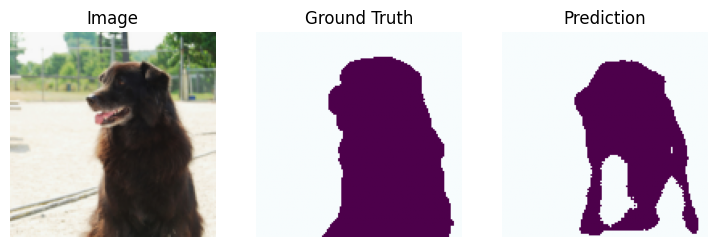

train epoch: 12 - iteration 32:
 - miou: 0.711517
 - dice: 0.831151
 - pixel accuracy: 0.416102
 - loss: 0.35915


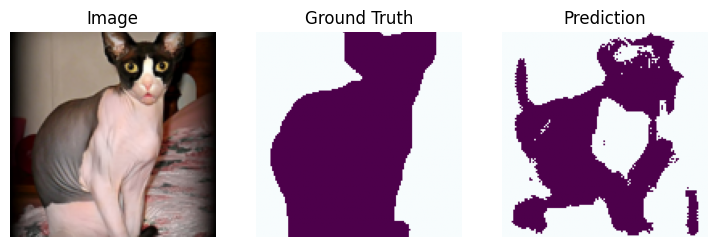

val epoch: 12 - iteration 1:
 - miou: 0.656649
 - dice: 0.792088
 - pixel accuracy: 0.397529
 - loss: 0.40586


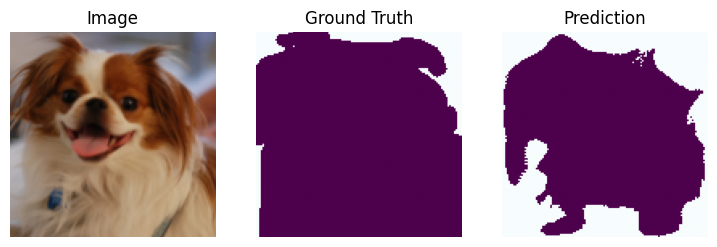

val epoch: 12 - iteration 8:
 - miou: 0.679608
 - dice: 0.80878
 - pixel accuracy: 0.405522
 - loss: 0.392835


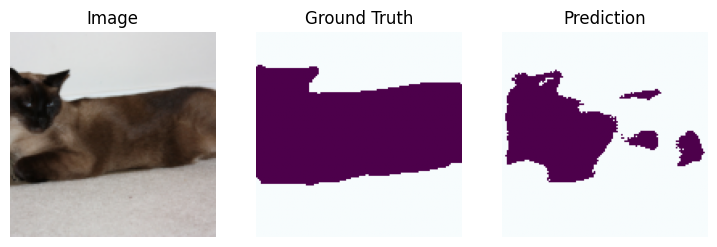

train epoch: 13 - iteration 1:
 - miou: 0.712564
 - dice: 0.831873
 - pixel accuracy: 0.416456
 - loss: 0.357763


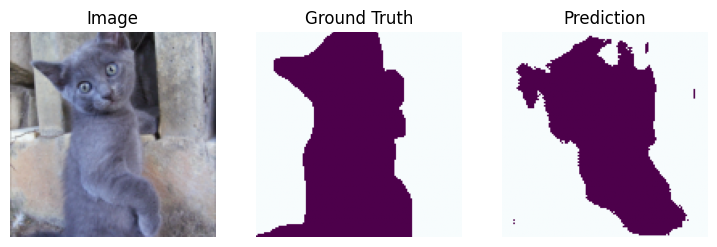

train epoch: 13 - iteration 16:
 - miou: 0.740055
 - dice: 0.850295
 - pixel accuracy: 0.425797
 - loss: 0.336924


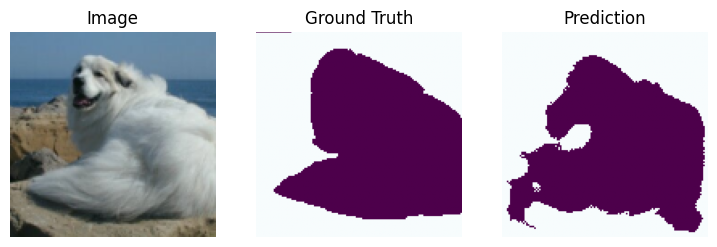

train epoch: 13 - iteration 32:
 - miou: 0.719012
 - dice: 0.836193
 - pixel accuracy: 0.418757
 - loss: 0.349039


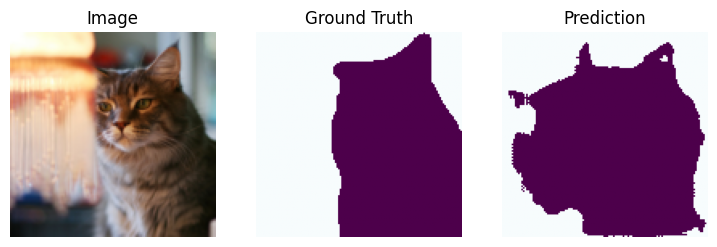

val epoch: 13 - iteration 1:
 - miou: 0.673925
 - dice: 0.804656
 - pixel accuracy: 0.403342
 - loss: 0.397086


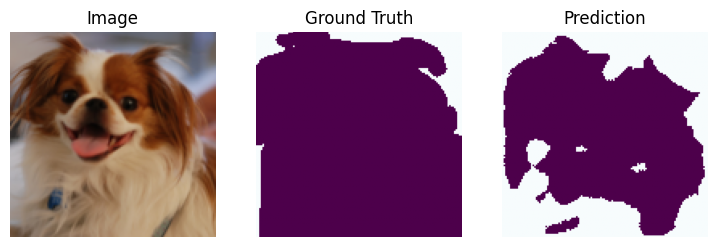

val epoch: 13 - iteration 8:
 - miou: 0.644721
 - dice: 0.782743
 - pixel accuracy: 0.393711
 - loss: 0.411555


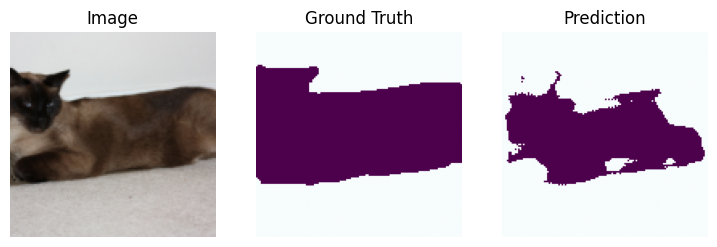

train epoch: 14 - iteration 1:
 - miou: 0.719039
 - dice: 0.836224
 - pixel accuracy: 0.418724
 - loss: 0.349152


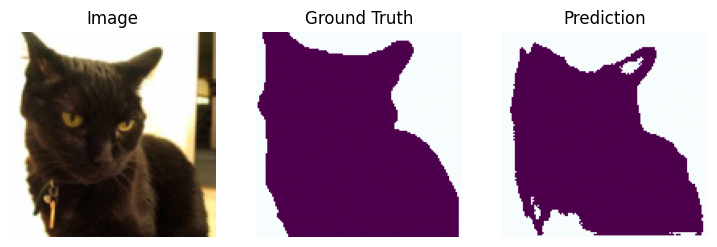

train epoch: 14 - iteration 16:
 - miou: 0.733092
 - dice: 0.845619
 - pixel accuracy: 0.423489
 - loss: 0.335877


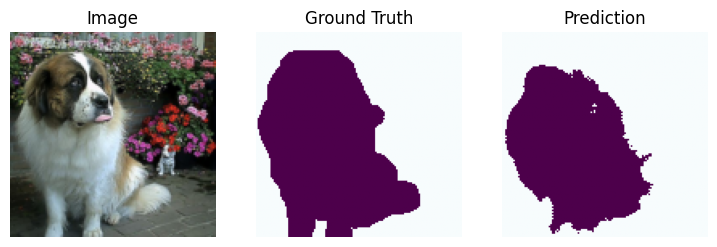

train epoch: 14 - iteration 32:
 - miou: 0.741002
 - dice: 0.851004
 - pixel accuracy: 0.42603
 - loss: 0.332338


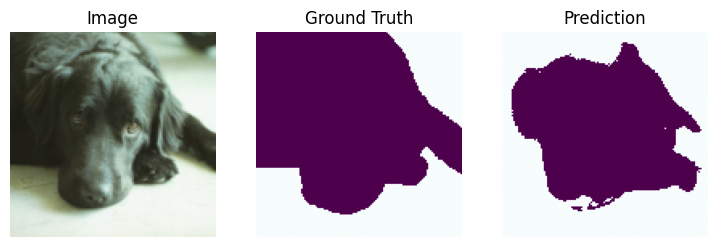

val epoch: 14 - iteration 1:
 - miou: 0.644109
 - dice: 0.78237
 - pixel accuracy: 0.393351
 - loss: 0.411267


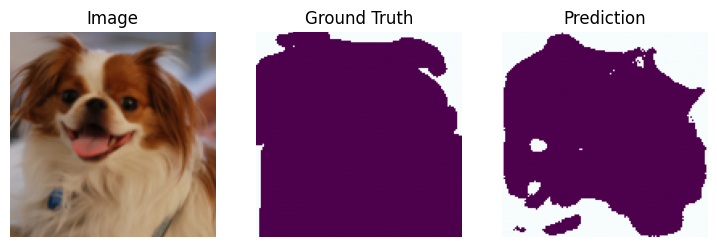

val epoch: 14 - iteration 8:
 - miou: 0.689181
 - dice: 0.815267
 - pixel accuracy: 0.408831
 - loss: 0.38116


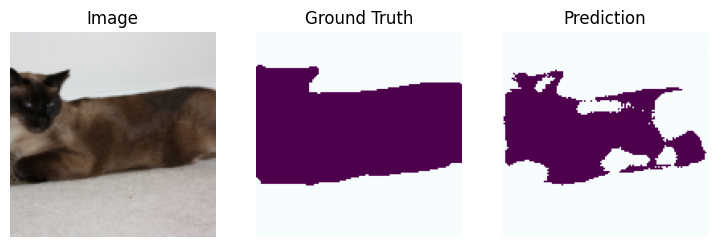

train epoch: 15 - iteration 1:
 - miou: 0.744630
 - dice: 0.853419
 - pixel accuracy: 0.427242
 - loss: 0.329544


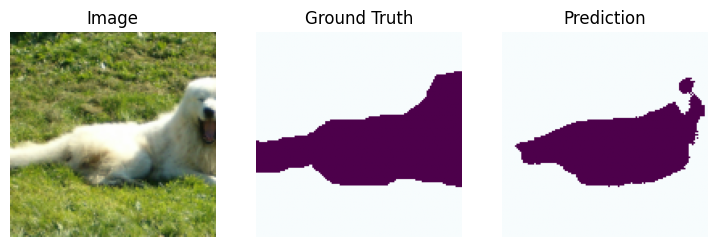

train epoch: 15 - iteration 16:
 - miou: 0.750703
 - dice: 0.857176
 - pixel accuracy: 0.429382
 - loss: 0.324787


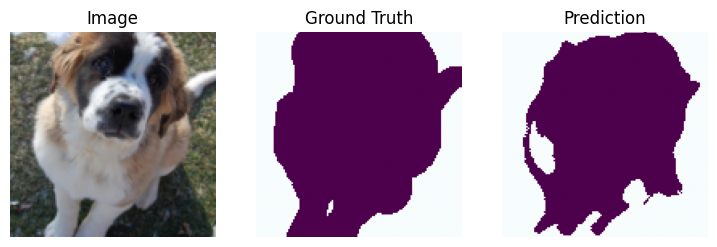

train epoch: 15 - iteration 32:
 - miou: 0.734336
 - dice: 0.846603
 - pixel accuracy: 0.423754
 - loss: 0.331954


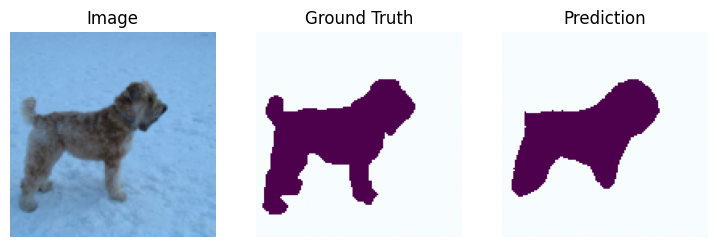

val epoch: 15 - iteration 1:
 - miou: 0.690397
 - dice: 0.816268
 - pixel accuracy: 0.40892
 - loss: 0.382648


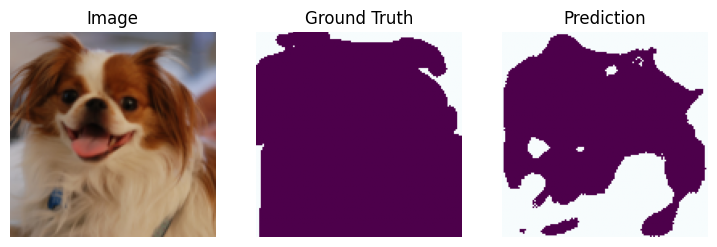

val epoch: 15 - iteration 8:
 - miou: 0.700913
 - dice: 0.823919
 - pixel accuracy: 0.412502
 - loss: 0.377304


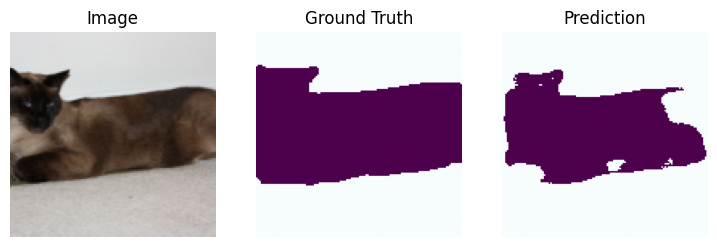

train epoch: 16 - iteration 1:
 - miou: 0.738773
 - dice: 0.84959
 - pixel accuracy: 0.425301
 - loss: 0.329478


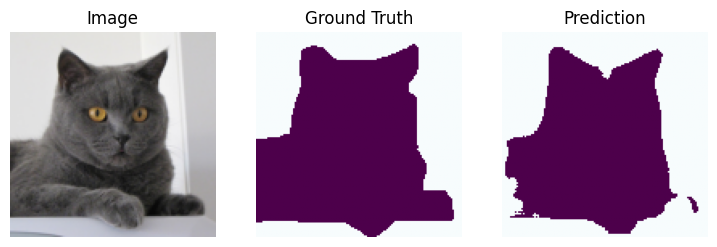

train epoch: 16 - iteration 16:
 - miou: 0.758423
 - dice: 0.862392
 - pixel accuracy: 0.431664
 - loss: 0.314134


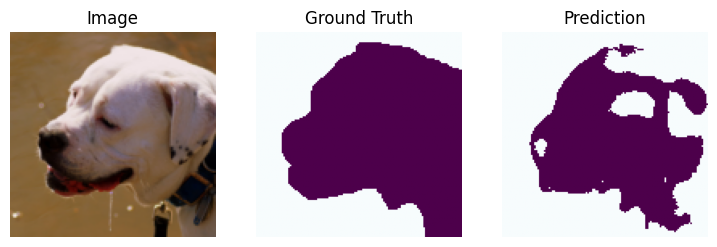

train epoch: 16 - iteration 32:
 - miou: 0.751406
 - dice: 0.85791
 - pixel accuracy: 0.429427
 - loss: 0.319625


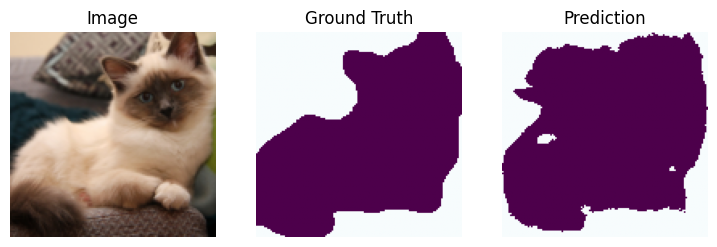

val epoch: 16 - iteration 1:
 - miou: 0.700348
 - dice: 0.823574
 - pixel accuracy: 0.412196
 - loss: 0.37798


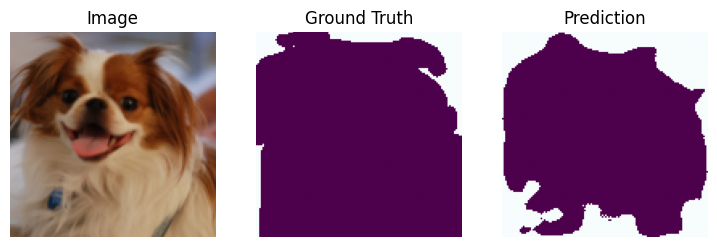

val epoch: 16 - iteration 8:
 - miou: 0.713082
 - dice: 0.832316
 - pixel accuracy: 0.416558
 - loss: 0.370441


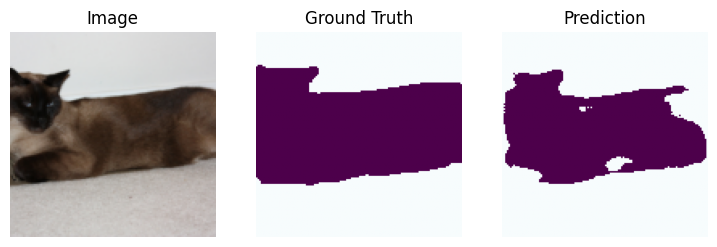

train epoch: 17 - iteration 1:
 - miou: 0.753026
 - dice: 0.858957
 - pixel accuracy: 0.429996
 - loss: 0.319481


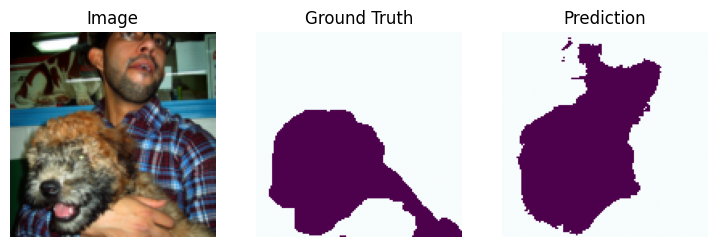

train epoch: 17 - iteration 16:
 - miou: 0.749960
 - dice: 0.856869
 - pixel accuracy: 0.428859
 - loss: 0.316889


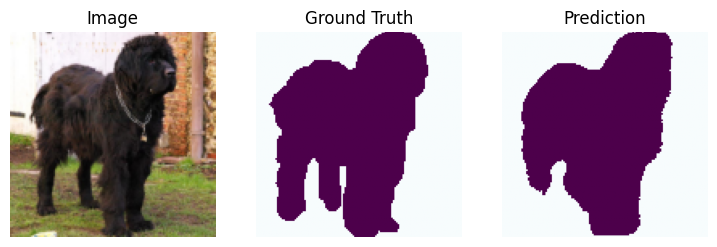

train epoch: 17 - iteration 32:
 - miou: 0.767879
 - dice: 0.868506
 - pixel accuracy: 0.434779
 - loss: 0.307121


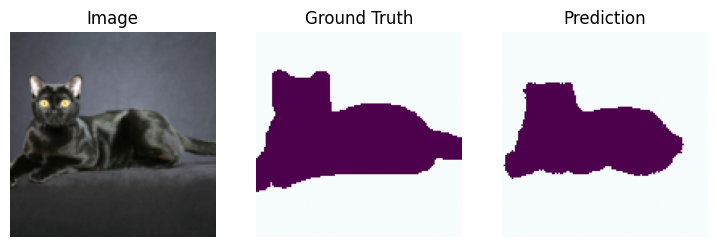

val epoch: 17 - iteration 1:
 - miou: 0.712235
 - dice: 0.831767
 - pixel accuracy: 0.416188
 - loss: 0.370105


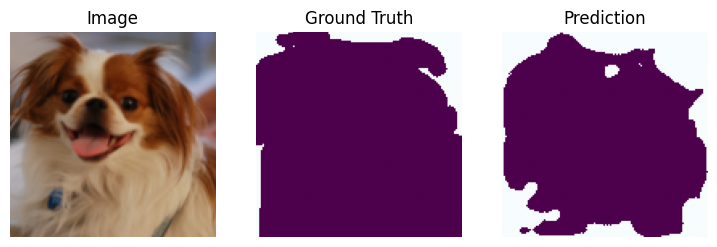

val epoch: 17 - iteration 8:
 - miou: 0.709105
 - dice: 0.829606
 - pixel accuracy: 0.415299
 - loss: 0.367388


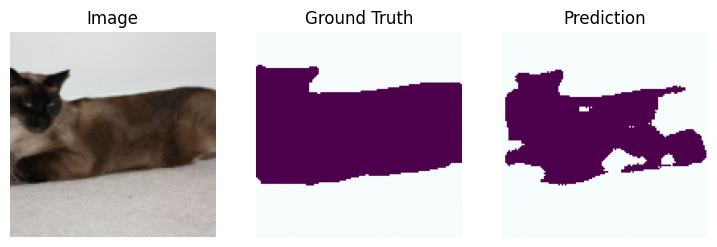

train epoch: 18 - iteration 1:
 - miou: 0.768643
 - dice: 0.868981
 - pixel accuracy: 0.435004
 - loss: 0.306447


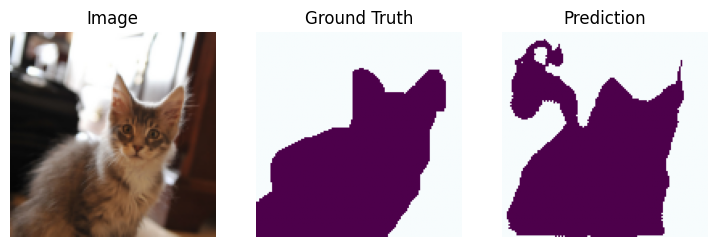

train epoch: 18 - iteration 16:
 - miou: 0.765099
 - dice: 0.86673
 - pixel accuracy: 0.433808
 - loss: 0.303355


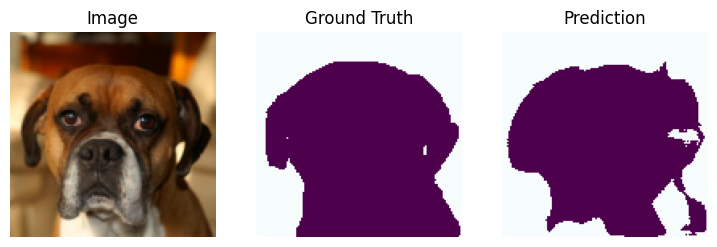

train epoch: 18 - iteration 32:
 - miou: 0.771431
 - dice: 0.870656
 - pixel accuracy: 0.435696
 - loss: 0.303652


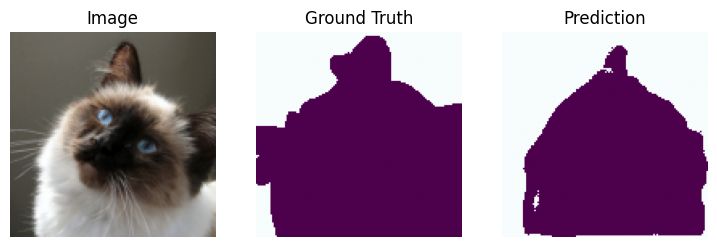

val epoch: 18 - iteration 1:
 - miou: 0.709835
 - dice: 0.83012
 - pixel accuracy: 0.415468
 - loss: 0.367317


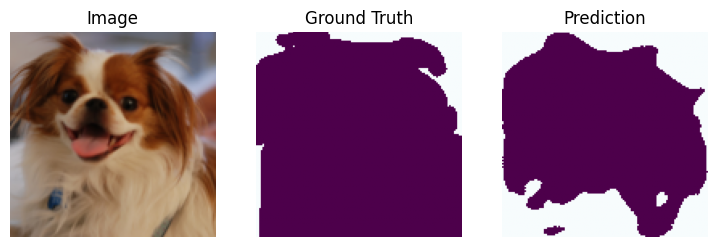

val epoch: 18 - iteration 8:
 - miou: 0.722589
 - dice: 0.838772
 - pixel accuracy: 0.419756
 - loss: 0.367818


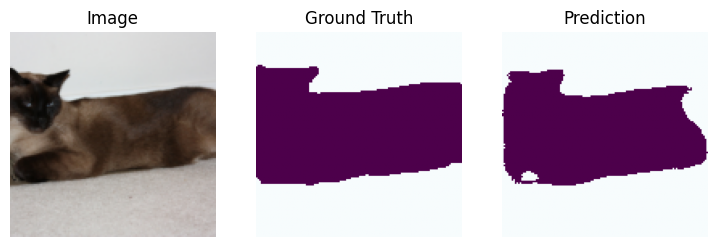

train epoch: 19 - iteration 1:
 - miou: 0.767752
 - dice: 0.868358
 - pixel accuracy: 0.434504
 - loss: 0.305407


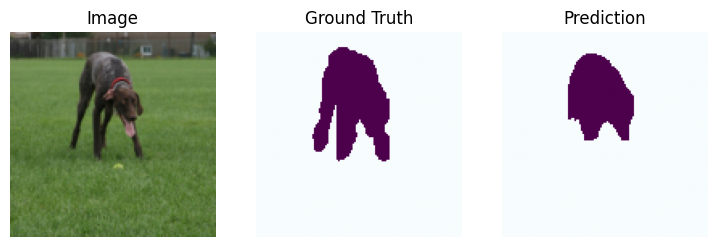

train epoch: 19 - iteration 16:
 - miou: 0.770318
 - dice: 0.870138
 - pixel accuracy: 0.435375
 - loss: 0.300813


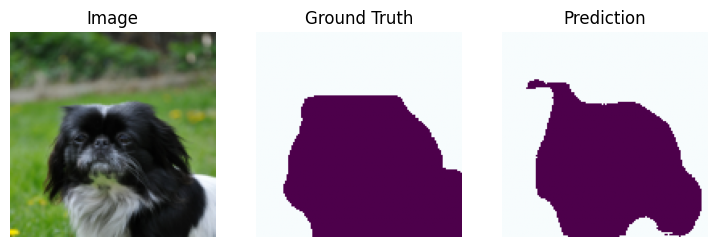

train epoch: 19 - iteration 32:
 - miou: 0.785181
 - dice: 0.879468
 - pixel accuracy: 0.440169
 - loss: 0.292112


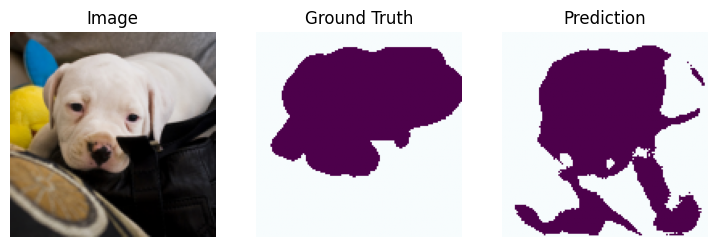

val epoch: 19 - iteration 1:
 - miou: 0.723065
 - dice: 0.83913
 - pixel accuracy: 0.419804
 - loss: 0.368041


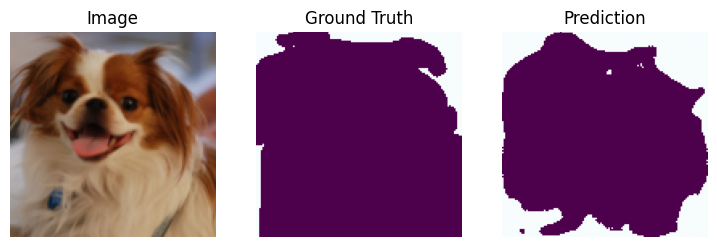

val epoch: 19 - iteration 8:
 - miou: 0.718546
 - dice: 0.836105
 - pixel accuracy: 0.41832
 - loss: 0.365628


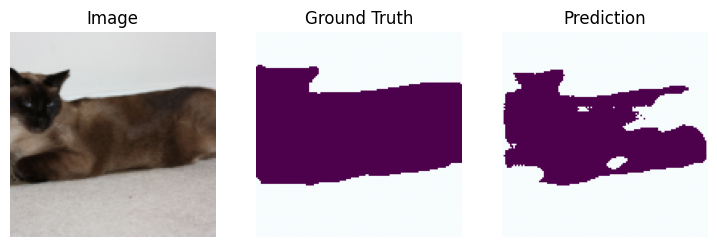

train epoch: 20 - iteration 1:
 - miou: 0.786657
 - dice: 0.88043
 - pixel accuracy: 0.440612
 - loss: 0.291123


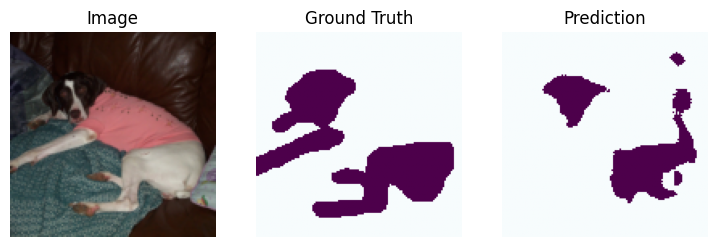

train epoch: 20 - iteration 16:
 - miou: 0.786989
 - dice: 0.880638
 - pixel accuracy: 0.440758
 - loss: 0.283399


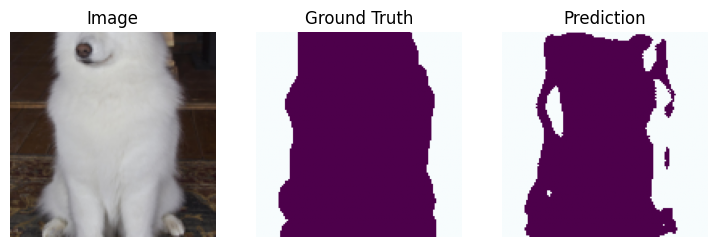

train epoch: 20 - iteration 32:
 - miou: 0.784753
 - dice: 0.879278
 - pixel accuracy: 0.440014
 - loss: 0.288376


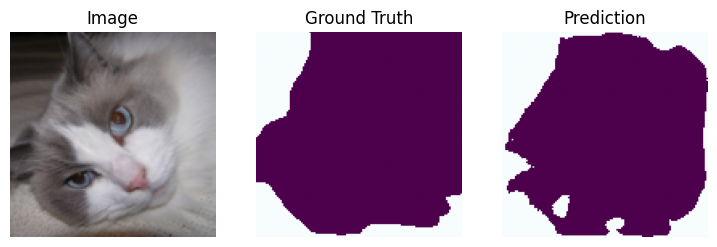

val epoch: 20 - iteration 1:
 - miou: 0.711686
 - dice: 0.831256
 - pixel accuracy: 0.416008
 - loss: 0.368416


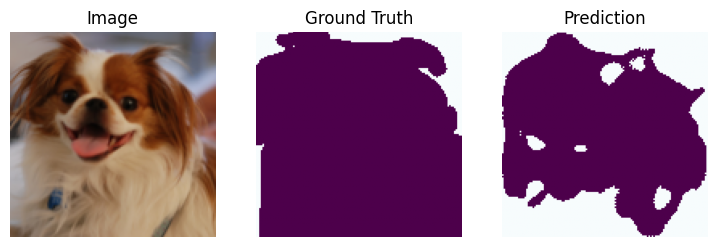

val epoch: 20 - iteration 8:
 - miou: 0.665602
 - dice: 0.798341
 - pixel accuracy: 0.400799
 - loss: 0.400115


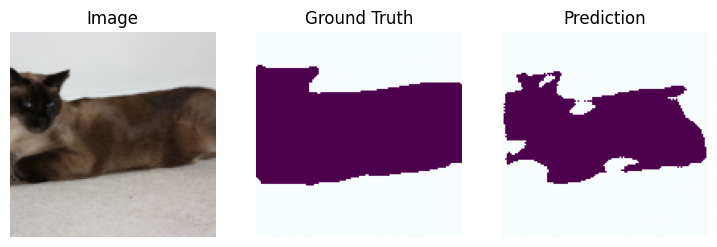

In [66]:
trainer = SegmentationTrainer(model, optimizer, log_iterations={"train": 16, "val": 8}, device=device)

for epoch in range(20):
    trainer.train_loader(train_loader)
    trainer.validate_loader(val_loader)

stats = trainer.stats

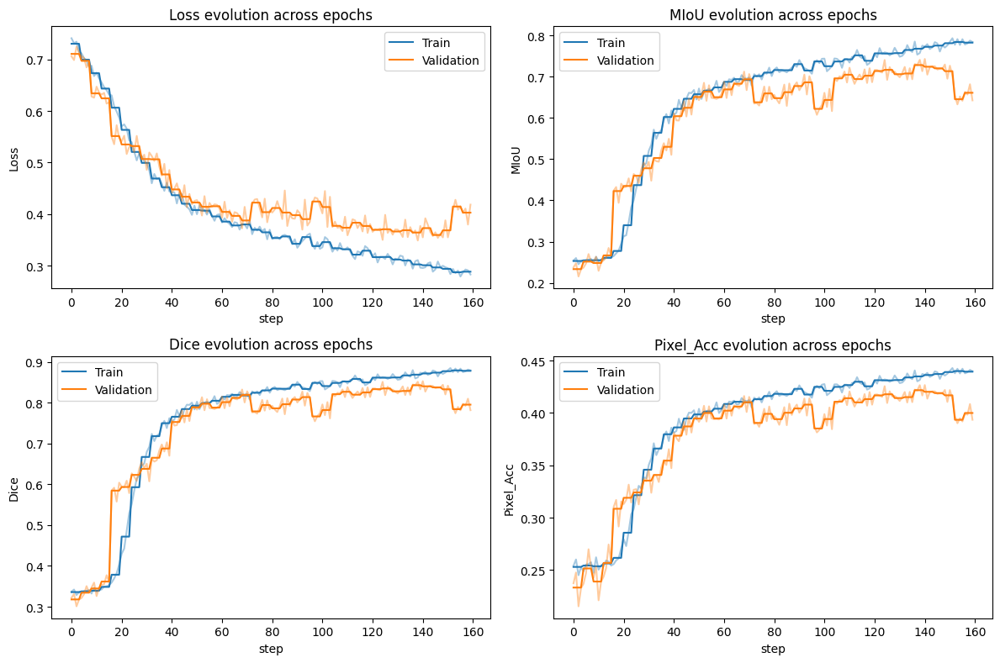

In [67]:
vtk.plot_stats(stats, attenuation=4)